# Detection of anomalous time series by feature extraction . The methodology is from R. Haydman's 2015 "Large-Scale Unusual Time Series Detection" https://robjhyndman.com/papers/cikm2015.pdf

In [ ]:
#import sys
#!{sys.executable} -m pip install plotly

In [ ]:
#!{sys.executable} -m pip install Cython fastkde

In [52]:
import numpy as np

import scipy as sp
from scipy import stats
from scipy import interpolate
import pandas as pd

import pylab as pl

from fastkde import fastKDE

import sklearn
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets.samples_generator import make_blobs
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 
from sklearn.metrics import pairwise_distances
from sklearn.manifold import TSNE

import statsmodels as sm
from statsmodels.tsa.stattools import acf, pacf
import statsmodels.api as sma
from statsmodels.api import OLS


%pylab inline
pl.rcParams['figure.figsize'] = (10,10)
pl.rcParams['font.size'] = 20
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go

Populating the interactive namespace from numpy and matplotlib


//anaconda/envs/earth-analytics-python/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning:

pylab import has clobbered these variables: ['plot', '__version__']
`%matplotlib` prevents importing * from pylab and numpy



# reading in data
The data is the Kepler sample of lightcurves. 

shape of lightcurve set (2500, 3, 100)


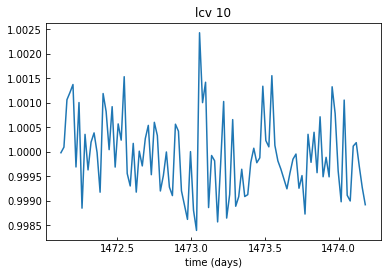

In [11]:
lcvsKep = np.load("../../../data/KeplerSampleWErr.npy")
print("shape of lightcurve set", lcvsKep.shape)
pl.plot(lcvsKep[10,0], lcvsKep[10,1])
pl.title("lcv 10");
pl.xlabel("time (days)")
lcvshape = lcvsKep.shape

In [128]:
lcvshape = lcvsKep.shape

# preprocessing:  normalizing and removing spikes

## normalizing

In [6]:
lcvsKepNormed = lcvsKep.copy()

In [7]:
# can't standardize well due to spikes...
lcvsKepNormed[:,1] = (lcvsKep[:,1] - 
                      np.atleast_2d(lcvsKep[:,1].mean(axis=1)).T ) /\
                      np.atleast_2d(lcvsKep[:,1].std(axis=1)).T
                    

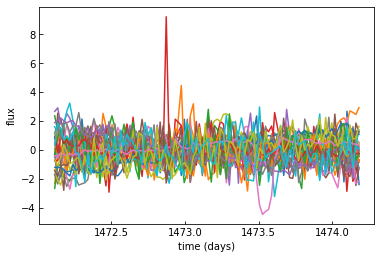

In [10]:
# plot a few random LCVs
np.random.seed(666)
seleted = random.choice(np.arange(lcvsKep.shape[0]), size=30, 
                        replace=False) 
for lcv in seleted:
    pl.plot(lcvsKepNormed[lcv, 0], lcvsKepNormed[lcv, 1])
pl.xlabel("time (days)")
pl.ylabel("flux");

the spikes are unphysical but make normalization tricky. removing them by low-pass-filtering will produce more realistic time series

## remove spikes by low pass filter
I am saving each set of lightcurves: 

*lcvsKepNormed*: Noramlized and preprocessed (standardized, mean subtracted)

*lcvsKepfized*: Spikes removes, no other filter

*lcvsKepLP*: Low pass filtered



In [12]:
lcvsKepLP = lcvsKep.copy()
lcvsKepfixed = lcvsKep.copy()
# place holders for medians and standard deviations
M = empty_like(lcvsKep)
S = empty_like(lcvsKep)


In [13]:
# replacing spikes: low pass filter with median on a window of 10
for i in range(lcvshape[0]):
    roller = pd.Series(lcvsKep[i,1]).rolling(min_periods=1, 
                                             window=10, 
                                             center=True)
    lcvsKepLP[i,1] = roller.median()

# normalized and standardized 
lcvsKepLP[:,1] = (lcvsKepLP[:,1] - 
                  np.atleast_2d(lcvsKepLP[:,1].mean(axis=1)).T) /\
                 np.atleast_2d(lcvsKepLP[:,1].std(axis=1)).T


In [14]:
# removing outliers only, leaving the rest intact 
# by replacing outliers with rolling median over window 15
# outliers are 3-sigma
for i in range(lcvshape[0]):
    roller = pd.Series(lcvsKep[i,1]).rolling(min_periods=1, 
                                              window=15, 
                                             center=True)
   
    # median
    M[i,1] = roller.median()
    # stdev
    S[i,1] = roller.std()
    
outliers = (np.abs(lcvsKepfixed[:,1] - M[:,1]) > 3 * S[:,1] )
lcvsKepfixed[:,1][outliers] = M[:,1][outliers]

In [20]:
lcvsKepfixednst = lcvsKepfixed.copy()
lcvsKepfixednst[:,1] = (lcvsKepfixed[:,1] - 
                  np.atleast_2d(lcvsKepfixed[:,1].mean(axis=1)).T) /\
                 np.atleast_2d(lcvsKepfixed[:,1].std(axis=1)).T

## plot a few example lightcurves

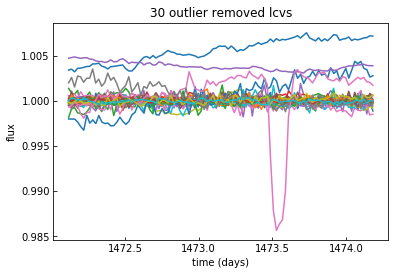

In [17]:
np.random.seed(666)
seleted = random.choice(np.arange(lcvsKepfixed.shape[0]), size=30, replace=False) 
for lcv in seleted:
    pl.plot(lcvsKepfixed[lcv, 0], lcvsKepfixed[lcv, 1])
pl.title("30 outlier removed lcvs")
pl.xlabel("time (days)")
pl.ylabel("flux");

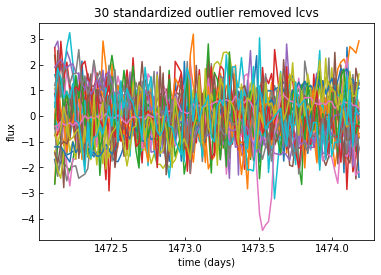

In [21]:
np.random.seed(666)
seleted = random.choice(np.arange(lcvsKepfixednst.shape[0]), size=30, replace=False) 
for lcv in seleted:
    pl.plot(lcvsKepfixednst[lcv, 0], lcvsKepfixednst[lcv, 1])
pl.title("30 standardized outlier removed lcvs")
pl.xlabel("time (days)")
pl.ylabel("flux");    

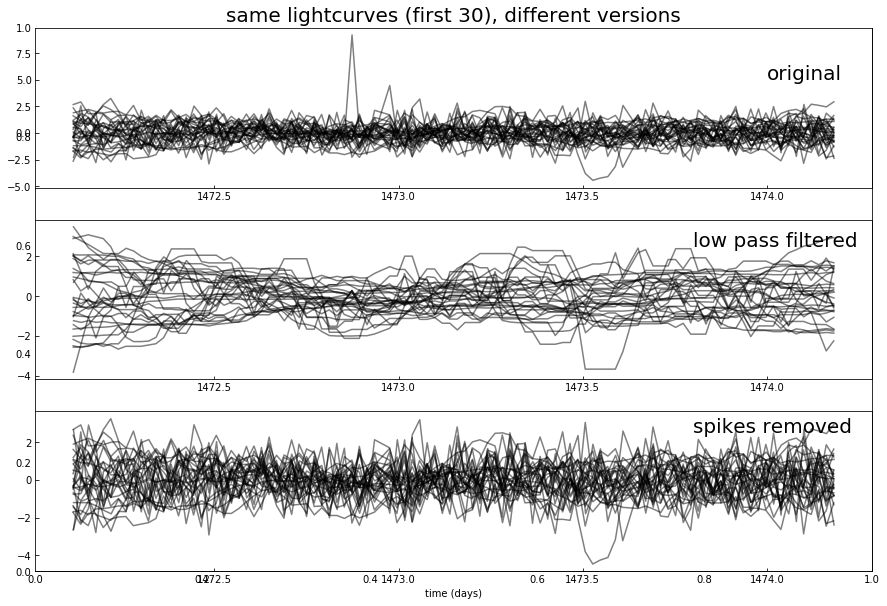

In [33]:
fig = pl.figure(figsize=(15,10))
pl.title("same lightcurves (first 30), different versions", fontsize=20)
ax1 = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)

for lcv in seleted[:30]:
    ax1.plot(lcvsKepNormed[lcv, 0], lcvsKepNormed[lcv, 1], 
             color="k", alpha=0.5)
    ax2.plot(lcvsKepLP[lcv, 0], lcvsKepLP[lcv, 1], 
             color="k", alpha=0.5)
    ax3.plot(lcvsKepfixednst[lcv, 0], lcvsKepfixednst[lcv, 1], 
             color="k", alpha=0.5)

ax1.text(1474, 5, "original", ha="left", fontsize=20)
ax2.text(1473.8, 2.5, "low pass filtered", ha="left", fontsize=20)
ax3.text(1473.8, 2.5, "spikes removed", ha="left", fontsize=20)
pl.xlabel("time (days)");

# PCA on time series directly

In [34]:
# setting up PCA model
pca = PCA()
pca.fit(lcvsKepfixednst[:,1])

# PCA model elements
coeffs = pca.transform(lcvsKepfixednst[:,1]) # -> the coefficients!!
evecs = pca.components_
evals = pca.explained_variance_ratio_
evals_cs = evals.cumsum()

#calculating PCA coefficients 
pcaCoeffMatrix = np.dot(evecs, lcvsKepfixednst[:,1].T).T

# reconstructed lightcurves
X_proj = pca.fit_transform(lcvsKepfixednst[:,1])
X_inv_proj = pca.inverse_transform(X_proj)


In [37]:
# manually reconstructed lightcurves 
xnew = np.array([np.sum(coeffs[i] * evecs.T, axis=1) 
                 for i in range(lcvsKepfixednst[:,1].shape[0])])
print("shape of reconstructed lcv set ", xnew.shape, 
      "should be same as original", lcvsKepfixed[:, 1].shape)

shape of reconstructed lcv set  (2500, 100) should be same as original (2500, 100)


## variance explained by PCs

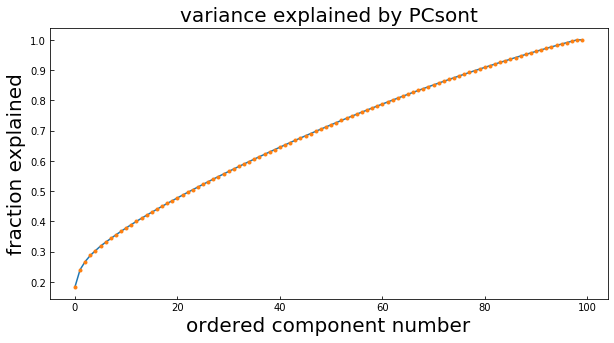

In [45]:
pl.figure(figsize=(10,5))
pl.plot(pca.explained_variance_ratio_.cumsum(), '-')
pl.plot(pca.explained_variance_ratio_.cumsum(), '.')
pl.title("variance explained by PCs", fontsize=20)
pl.xlabel("ordered component number", fontsize=20)
pl.ylabel("fraction explained", fontsize=20);

the first component conveys only 20% of the variance and the growth in variance explained is slow after the 3rd component

(0.15, 0.4870332329700484)

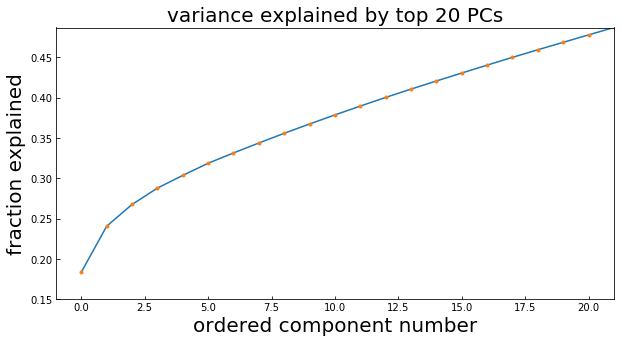

In [51]:
pl.figure(figsize=(10,5))
pl.plot(pca.explained_variance_ratio_.cumsum(), '-')
pl.plot(pca.explained_variance_ratio_.cumsum(), '.')
pl.title("variance explained by top 20 PCs", fontsize=20)
pl.xlabel("ordered component number", fontsize=20)
pl.ylabel("fraction explained", fontsize=20);
pl.xlim(-1,21);
pl.ylim(0.15, pca.explained_variance_ratio_.cumsum()[21])

even 20 components only get to 50%!

(2500, 2)

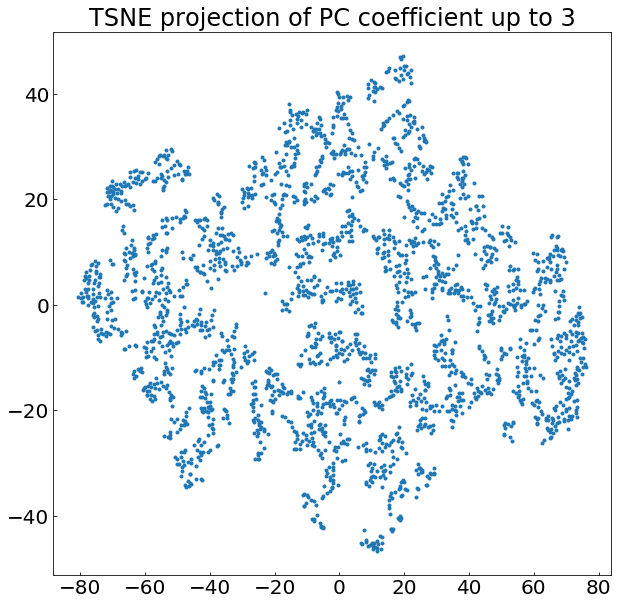

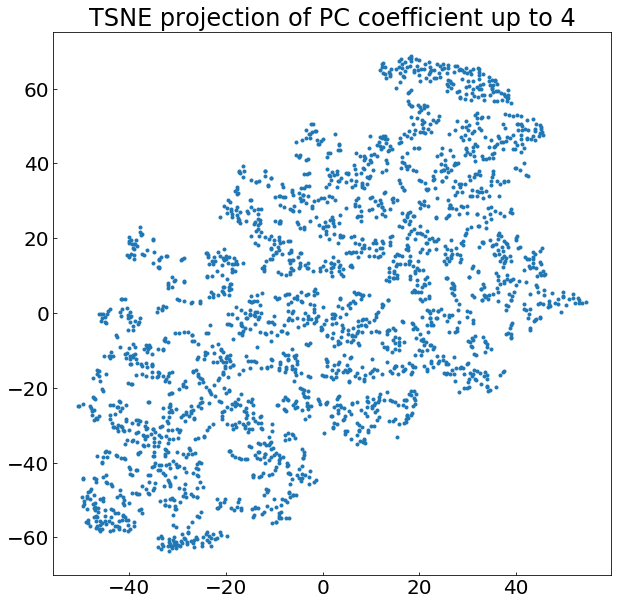

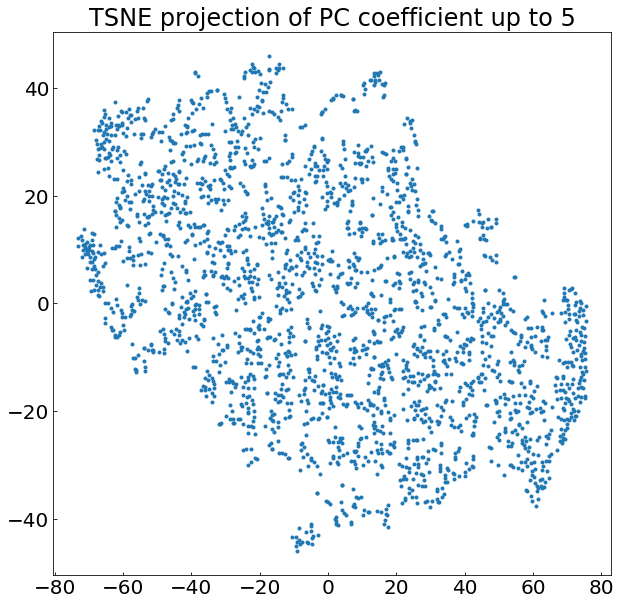

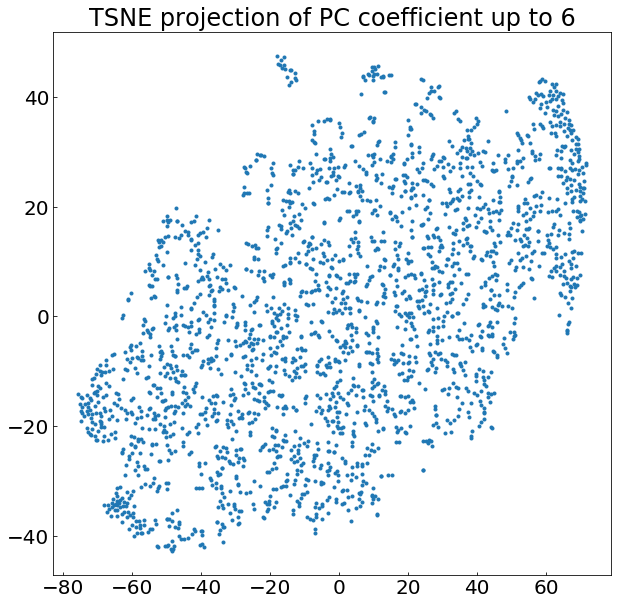

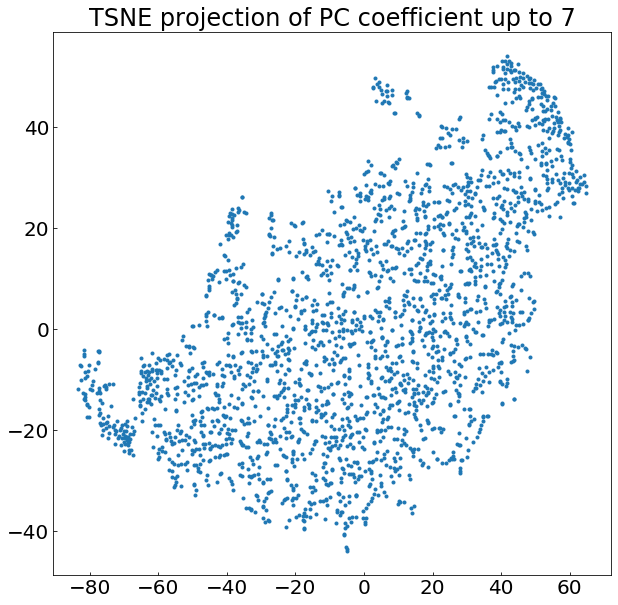

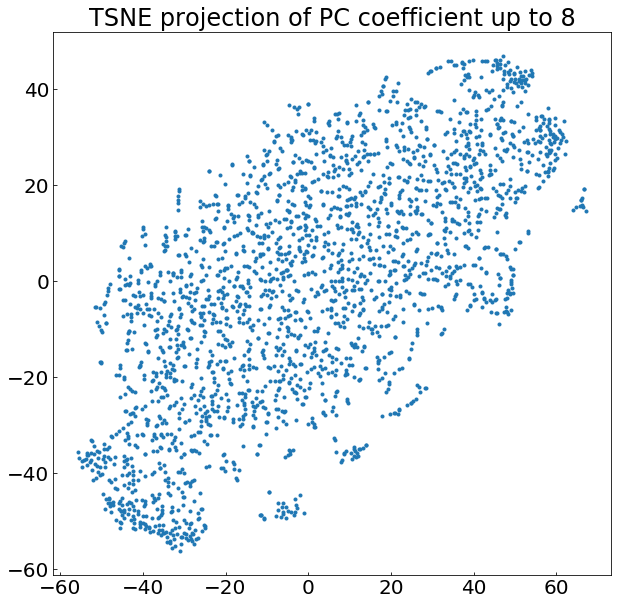

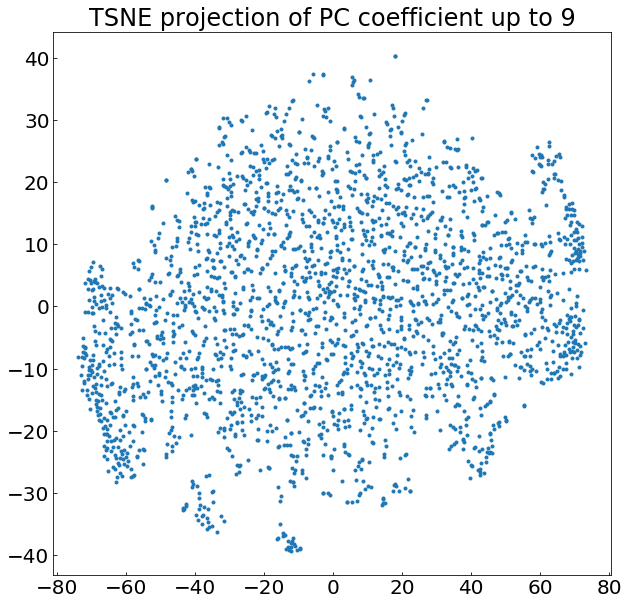

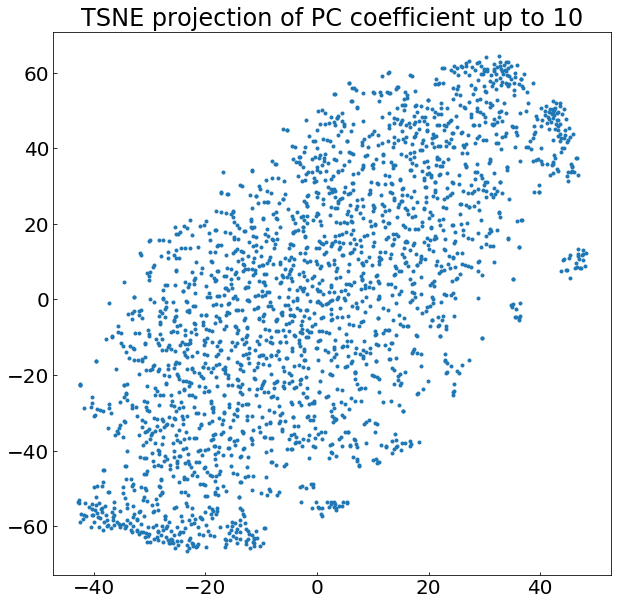

In [156]:
for i in range(3,10):
    embedded = TSNE(n_components=2).fit_transform(coeffs[:,:i])
    pl.figure()
    pl.title("TSNE projection of PC coefficient up to %d"%i)
    pl.plot(embedded[:,0], embedded[:,1], '.')
embedded.shape

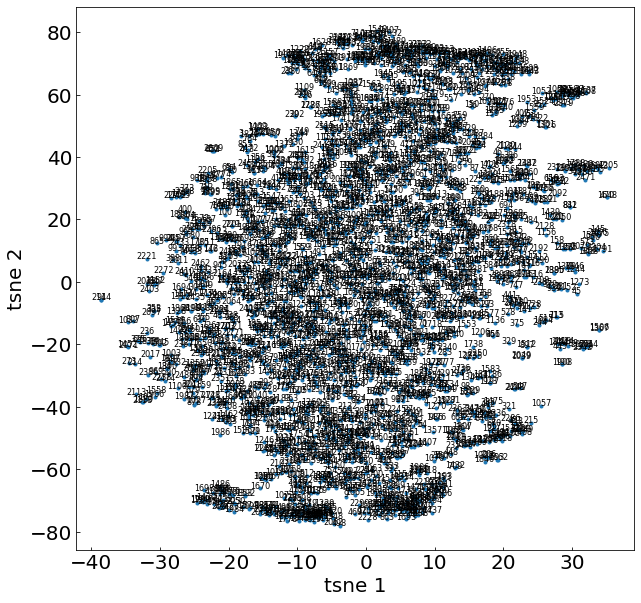

the 2d TSNE projection of the first 10 components returns a densely populated space. There are outliers tho, e.g. 2221, 1057


In [66]:
#embedded = TSNE(n_components=2).fit_transform(coeffs[:,:10])
pl.plot(embedded[:,0], embedded[:,1], '.')
for i in range(len(embedded[:,0])):
    pl.text(embedded[i,0], embedded[i,1], "%d"%i, ha='center', fontsize=8)
pl.xlabel("tsne 1")
pl.ylabel("tsne 2");
pl.show()
print("the 2d TSNE projection of the first 10 components returns a densely populated space. " + 
      "There are outliers tho, e.g. 2221, 1057")

## lightcurves distance in marginalized PCA components 

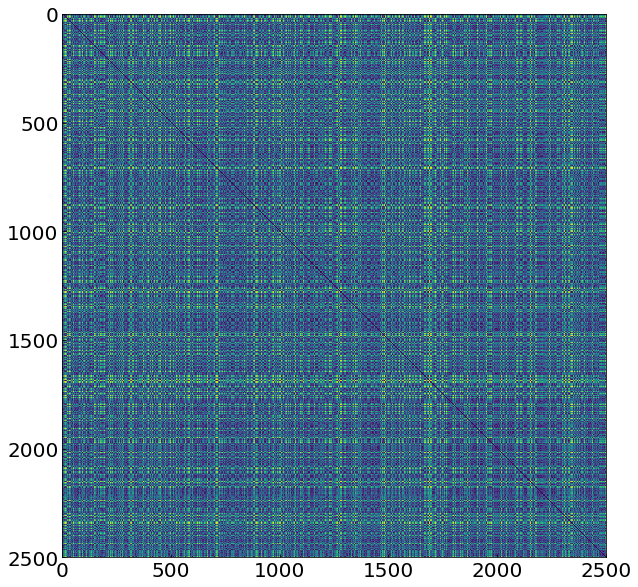

distance matrix in marginalized 1-10 Principal Components


In [67]:
ds = sp.spatial.distance_matrix(np.array([embedded[:,0], embedded[:,1]]).T,
                                      np.array([embedded[:,0], embedded[:,1]]).T)
imshow(ds)
pl.show()
print("distance matrix in marginalized 1-10 Principal Components")

## average distance to closest 10 objects in 10-components 2D projection

In [95]:
def calcAv10distance(d):
    return np.array([np.median(np.sort(d[i])[1:10]) for i in range(d.shape[0])])

av10distance = calcAv10distance(ds)
print("""25 most isolated objects
based on mean distance of 10 closest neighbours 
in PCA 10-components projection:
""", 
      np.argsort(av10distance)[-25:])

25 most isolated objects
based on mean distance of 10 closest neighbours 
in PCA 10-components projection:
 [ 713  115  214 2250  329 2069  454  273 1032  652 2221 2498 2241  547
 1908  190 1039 2049 1367 1506 1057 1648  470   91 2144]


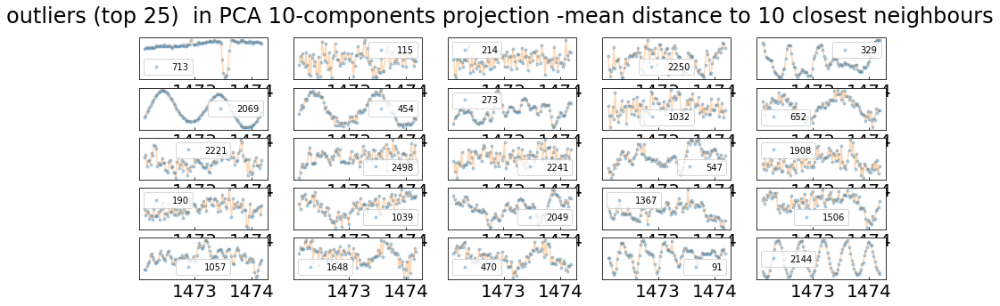

In [96]:
fig = pl.figure(figsize=(15,5))
for j,i in  enumerate(np.argsort(av10distance)[-25:]):
    ax=fig.add_subplot(5,5,j+1)
    ax.plot(lcvsKepfixed[i,0], lcvsKepfixed[i,1], '.', alpha=0.3, label="%.d"%i)
    ax.plot(lcvsKepfixed[i,0], lcvsKepfixed[i,1], '-', alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_yticks([])    
pl.suptitle("""outliers (top 25)  in PCA 10-components projection -median distance to 10 closest neighbours
""")
pl.savefig("outliersfixed1.png")

this is unlikely to have worked well: some of the lightcurves are very regular binary lightcurves that are visibly similar: 2144, 2069, 454, 652

##  density in 2D 10-components projection

In [97]:
densityatpoints = fastKDE.pdf_at_points(embedded[:,0], embedded[:,1], 
                      list_of_points = list(zip(embedded[:,0],
                                                embedded[:,1])))

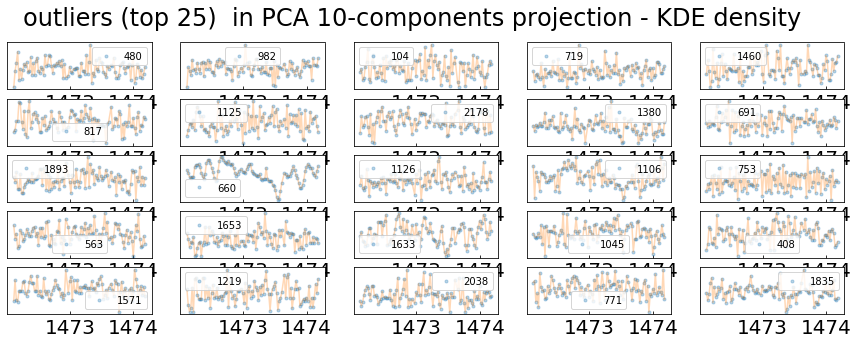

In [98]:
fig = pl.figure(figsize=(15,5))
for j,i in  enumerate(np.argsort(densityatpoints)[-25:]):
    ax=fig.add_subplot(5,5,j+1)
    ax.plot(lcvsKepfixed[i,0], lcvsKepfixed[i,1], '.', alpha=0.3, label="%.d"%i)
    ax.plot(lcvsKepfixed[i,0], lcvsKepfixed[i,1], '-', alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_yticks([])    
pl.suptitle("outliers (top 25)  in PCA 10-components projection - KDE density")
pl.savefig("outliersfixed2.png")

this is more promising! some of the lightcurves seem unusual: 2038, 1835, 660, and we lost the regular eclipsing binaries

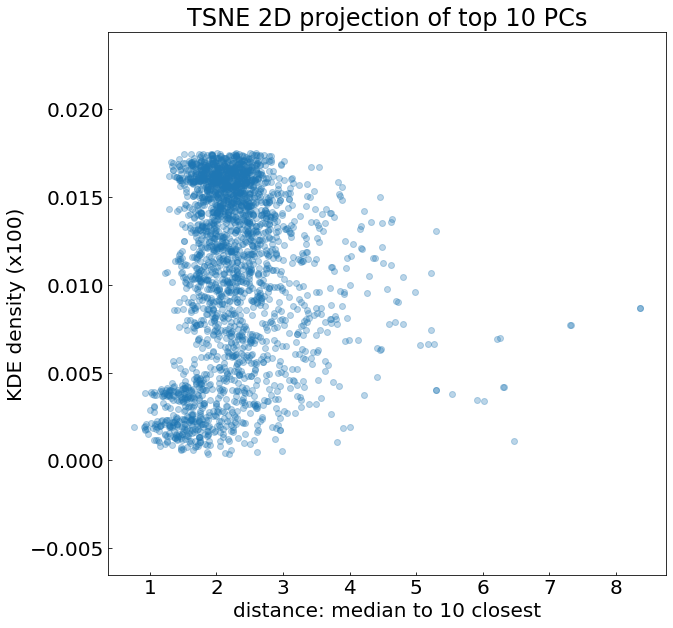

TSNE 2D projection of top 10 PCs: KDE density (x100) vs median distance to closest 10. The two metrics are uncorrelated! the KDE density seems a better choice


In [101]:
ax = pl.figure().add_subplot(111)
pl.title("TSNE 2D projection of top 10 PCs")
pl.xlabel("distance: median to 10 closest")
pl.ylabel("KDE density (x100)")

pl.scatter(av10distance, densityatpoints * 100, alpha=0.3,
          label="average distance vs density");
pl.show()
print("TSNE 2D projection of top 10 PCs: KDE density (x100) vs median distance to closest 10. " + 
      "The two metrics are uncorrelated! the KDE density seems a better choice")

In [103]:
sp.stats.pearsonr(densityatpoints, av10distance)

(0.07646049851194399, 0.00012986437108542277)

the two isolation metrics return almost completely uncorrelated

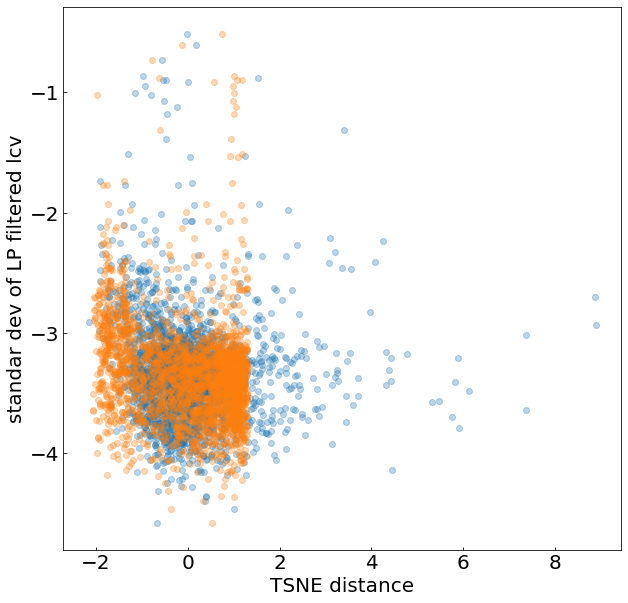

In [102]:
ax = pl.figure().add_subplot(111)
pl.xlabel("TSNE distance")
pl.ylabel("standar dev of LP filtered lcv")

pl.scatter((av10distance - av10distance.mean()) / av10distance.std(), 
           np.log10((lcvsKep[:,1]).std(axis=1)), alpha=0.3,
          label="power spectrum")
pl.scatter((densityatpoints - densityatpoints.mean()) / densityatpoints.std(), np.log10((lcvsKep[:,1]).std(axis=1)), alpha=0.3,
          label="power spectrum");


neither shows a strong correlation with the standard deviation, which is good (unlike random forest on the time series directly)

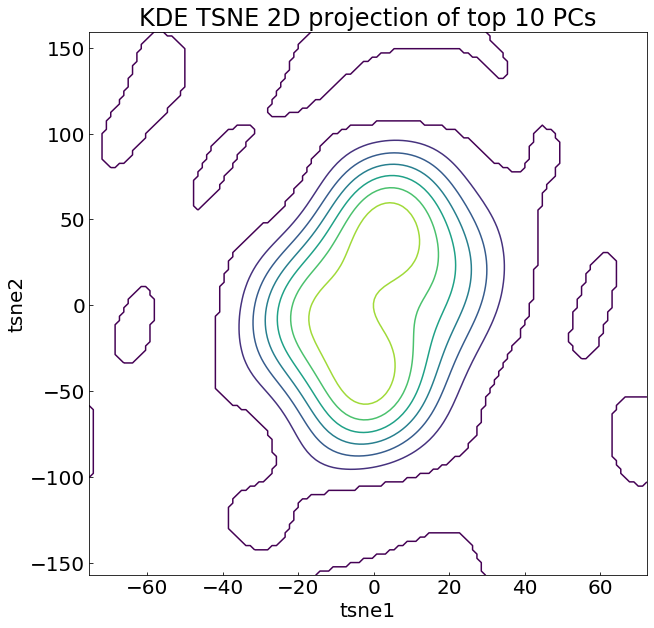

In [119]:
myPDF,axes = fastKDE.pdf(embedded[:,0], embedded[:,1])

#Extract the axes from the axis list
v1,v2 = axes

#Plot contours of the PDF should be a set of concentric ellipsoids centered on
#(0.1, -300) Comparitively, the y axis range should be tiny and the x axis range
#should be large
pl.contour(v1,v2, myPDF);
pl.title("KDE TSNE 2D projection of top 10 PCs")
pl.xlabel("tsne1")
pl.ylabel("tsne2");

# interactive plot of 2D TSNE projection of top 10 PC with density contourns

In [104]:
init_notebook_mode(connected=True)

In [105]:
iplot([go.Histogram2dContour(x=embedded[:,0], y=embedded[:,1], 
                             contours=dict(coloring='heatmap')),
       go.Scatter(x=embedded[:,0], y=embedded[:,1], text = ["%d"%i for i in range(2500)],
        hoverinfo = 'text',
                  mode='markers', 
                  marker=dict(color=list(range(2500)), size=3, opacity=0.3))], show_link=False)


In [109]:
rankAvD = np.zeros(len(av10distance), int)
rankAvD[np.argsort(av10distance)] = np.arange(len(av10distance)).astype(int)
np.argsort(rankAvD)[:10]

(array([ 876, 2341, 1043, 1973, 2237,  385,  974,  511,  143, 2058]), 0)

In [113]:
rankKDE1 = np.zeros(len(densityatpoints), int)
rankKDE1[np.argsort(densityatpoints)[::-1]] = np.arange(len(densityatpoints)).astype(int)
np.argsort(densityatpoints)[:10]

array([1662, 1468,  593, 2349, 1437,  215, 1040, 1538, 1693, 2394])

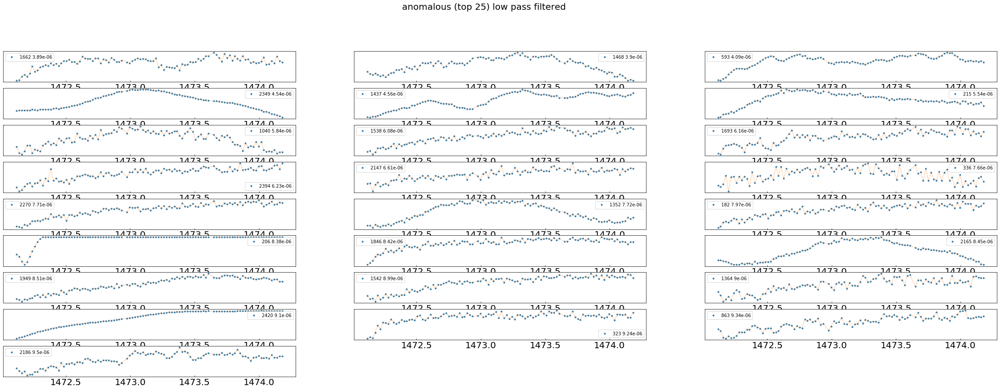

In [123]:
fig = pl.figure(figsize=(40,15))
for j,i in  enumerate(np.argsort(densityatpoints)[:25]):
    ax=fig.add_subplot(10,3,j+1)
    ax.plot(lcvsKepfixed[i, 0], lcvsKepfixed[i, 1], '.', 
            label="%d %.3g"%(i, densityatpoints[i]))
    ax.plot(lcvsKepfixed[i, 0], lcvsKepfixed[i, 1], '-', alpha=0.3)
    ax.legend(fontsize=10)
    ax.set_yticks([])    
pl.suptitle("anomalous (top 25) low pass filtered", fontsize=20);


# feature engineering

## mean & variance

In [146]:
means = np.mean(lcvsKepfixed[:,1], axis=1)
variances = np.std(lcvsKepfixed[:,1], axis=1)

## auto correlation

In [149]:
acf1 = np.asanyarray([acf(lcvsKepfixed[i,1])[1] 
                      for i in range(len(lcvsKepfixed))])

## crossings

In [150]:
def crossing(data):
    signs = np.array([sign(d) for d in data - data.mean()])
    return np.where(signs[1:] * signs[:-1] < 0)

In [151]:
cpoints = np.asanyarray([len(crossing(k)[0]) for k in lcvsKepfixednst[:,1]])

## entropy

In [176]:
psN = ps / ps.shape[1]
lcentropy = -(psN * np.log(psN)).sum(axis=1)

# adding frequency information via Power spectrum

example power spectra: for an obviously periodic lcv and for the first (not obviously periodic) lcv

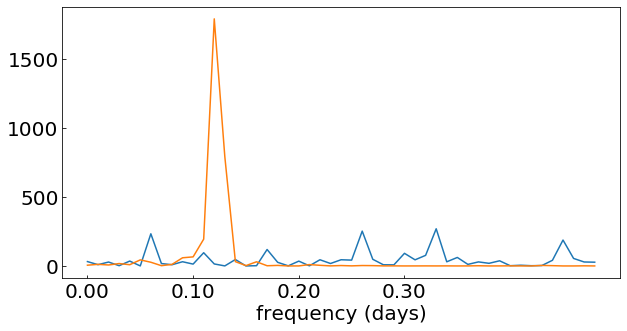

In [133]:
powerspoectrum = np.fft.rfft(lcvsKepfixednst[:,1,:])
ps = np.asanyarray([np.real(powerspoectrum[i])[2:]**2 
                    for i in range(2500)])
pl.figure(figsize=(10,5))
pl.plot(ps[1])
pl.plot(ps[12])
freqs = np.fft.rfftfreq(lcvshape[2], 0.1)
pl.xlabel("frequency (days)")
pl.xticks(range(0, 40, 10), labels=["%.2f"%fr for fr in freqs]);

## finding main peak and only retaining if statistically significant

In [134]:
# calculate best period, removing the last 3 time stamps (dont believe a period that only repeats 35 of the data)
argmaxps = np.argmax(np.concatenate([
                    ps[:,:-2],
                    np.asanyarray([[0,0,0]] * 2500)], axis=1),
          axis=1)
maxpss = np.asanyarray([ps[i][argmaxps[i]] 
                        for i in range(len(ps))])

# calculate the statistical significant of the best period in units of 3-sigma
ths = np.std(ps, axis=1) * 3 + np.mean(ps, axis=1)
maxpss /= ths

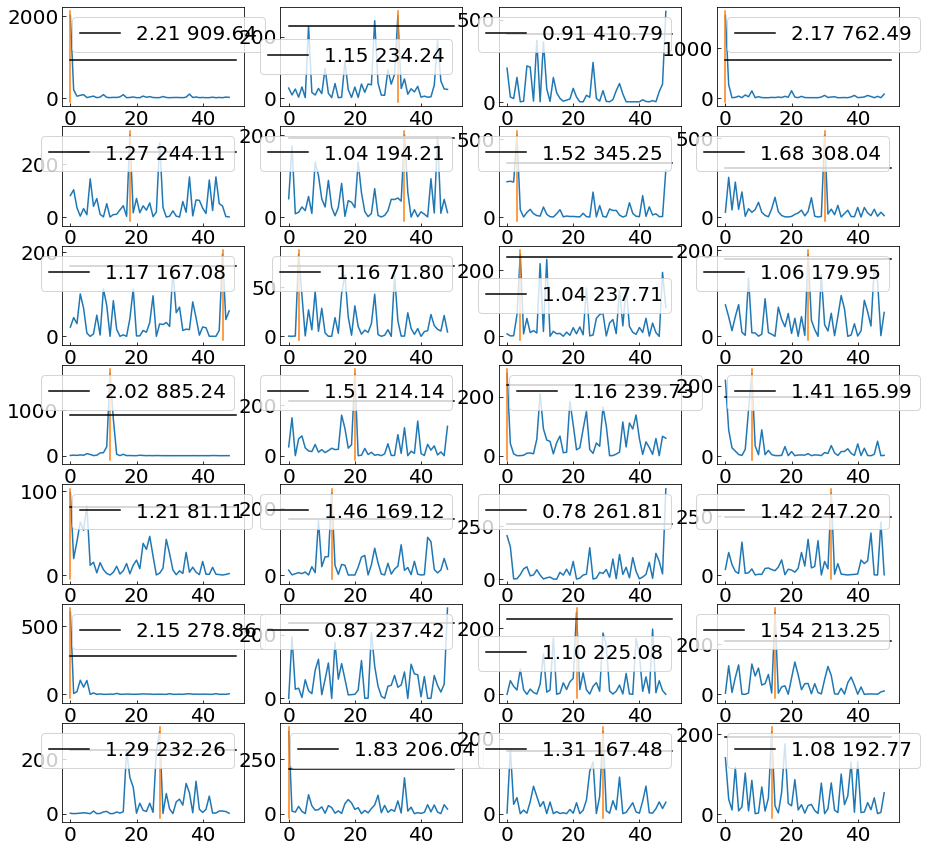

In [144]:
fig = pl.figure(figsize=(15,15))
for i in range(0,28,1):
    ax = fig.add_subplot(7,4,i+1)
    pl.plot(ps[i])
    if maxpss[i] > 1:
        pl.plot([argmaxps[i], argmaxps[i]], pl.ylim())
    pl.plot([0,50], [ths[i],ths[i]], 'k', label="%.2f %.2f"%(
            maxpss[i], ths[i]))
    pl.legend()

## linearity
linearity is the R^2 of a linear fit

In [159]:
linmmodels = [sma.OLS(exog=sma.add_constant(lcvsKepfixednst[i,0]), 
                                        endog=lcvsKepfixednst[i,1]).fit() 
             for i in range(len(lcvsKepfixednst))]
linearity = np.array([linmmodels[i].rsquared for i in range(lcvshape[0])])


## trend
the slope of the linear fit is the trend

In [213]:
trend = np.asanyarray([linmmodels[i].params[1] for i in range(lcvshape[0])])

## curvature
the 2nd order polynomial x^2 coefficient

In [162]:
numpy.polyfit(lcvsKepfixednst[0,0], 
                            lcvsKepfixednst[0,1], 2)

array([-6.51597460e-01,  1.91923310e+03, -1.41324015e+06])

In [164]:
curvature = [numpy.polyfit(lcvsKepfixednst[i,0], 
                            lcvsKepfixednst[i,1], 2)[0] 
             for i in range(len(lcvsKepfixednst))]


## seasonality

In [165]:
lcfft = np.fft.rfft(lcvsKepfixed[:,1,:])
ps = np.asanyarray([np.real(lcfft[i])[1:]**2 for i in range(2500)])
mainPeriod = ps.argmax(axis=1) + 1
n = lcvshape[2]

freqs = np.fft.rfftfreq(n, 1)
[1/freqs[mainPeriod[i]] for i in range(10)]

[50.0,
 2.8571428571428568,
 2.0,
 50.0,
 5.0,
 2.7027027027027026,
 20.0,
 3.125,
 100.0,
 100.0]

In [166]:
# fold
def folding(flux, freq, cycles=1, maxps=0):
    #print (1/freq)
    if maxps < 1 :
        return flux, np.arange(flux.shape[0])
    #folds a periodic lightcurve
    newtime = np.mod(np.arange(flux.shape[0]), float(cycles) / freq)
    #print(newtime)
    indx = np.argsort(newtime)
    return flux[indx], indx#np.mod(runtime, float(cycles) / freq)

In [169]:
# low pass filtering folded lightcurves
newlcs = np.asanyarray([folding(lcvsKepfixednst[i,1], 
                  freqs[mainPeriod[i]], maxps = maxpss[i])
          for i in range(lcvshape[0])])
newlcsLP = np.empty_like(newlcs[:,0])
for i,nlc in enumerate(newlcs[:,0]):
    roller = pd.Series(nlc).rolling(min_periods=1,
                                    window=10,
                                    center=True)
    newlcsLP[i] = roller.mean()


means variances acf1 cpoints entropy linearity trend curvature maxpss (only used if >1)


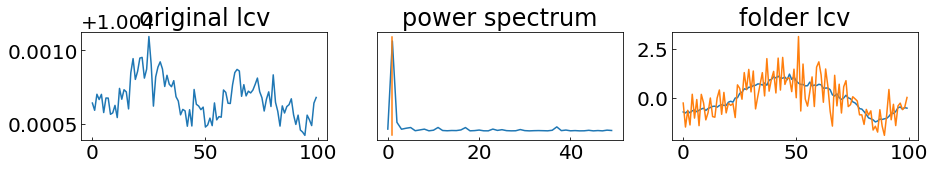

means variances acf1 cpoints entropy linearity trend curvature maxpss
1.005	0.000	0.707	23.000	0.002	0.118	-0.568	-0.652	2.207


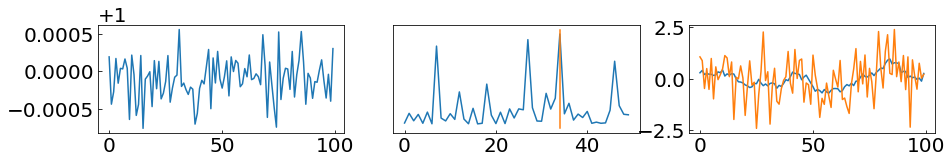

means variances acf1 cpoints entropy linearity trend curvature maxpss
1.000	0.000	-0.135	52.000	0.005	0.010	0.164	-0.002	1.148


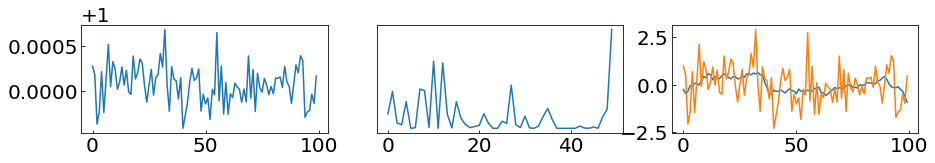

means variances acf1 cpoints entropy linearity trend curvature maxpss
1.000	0.000	0.108	46.000	0.005	0.021	-0.241	0.181	0.908


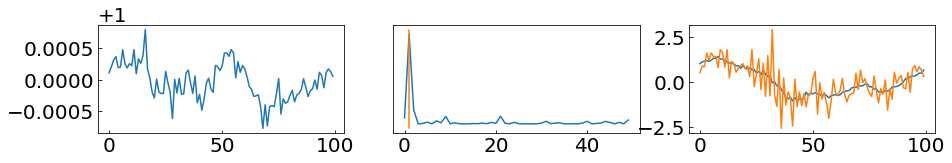

means variances acf1 cpoints entropy linearity trend curvature maxpss
1.000	0.000	0.711	26.000	0.007	0.147	-0.633	0.742	2.171


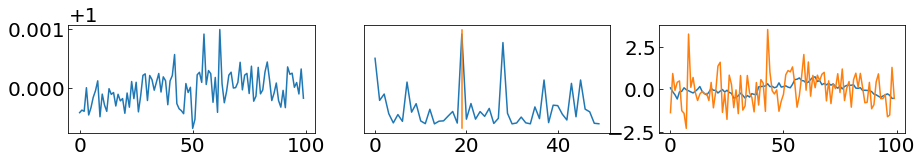

means variances acf1 cpoints entropy linearity trend curvature maxpss
1.000	0.000	0.145	46.000	0.007	0.108	0.542	-0.673	1.272


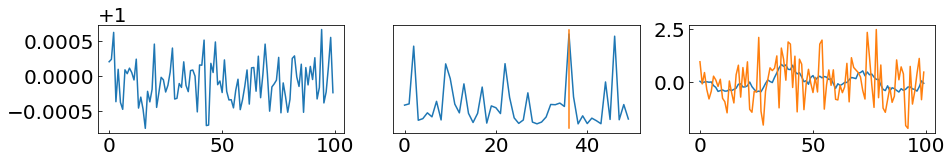

means variances acf1 cpoints entropy linearity trend curvature maxpss
1.000	0.000	0.009	47.000	0.006	0.003	0.084	0.420	1.037


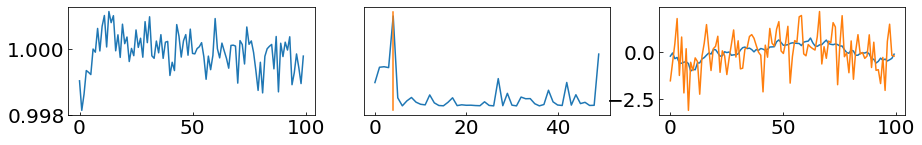

means variances acf1 cpoints entropy linearity trend curvature maxpss
1.000	0.001	0.293	44.000	0.025	0.035	-0.307	-0.811	1.521


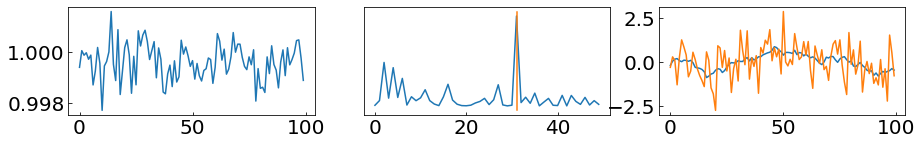

means variances acf1 cpoints entropy linearity trend curvature maxpss
1.000	0.001	0.181	42.000	0.033	0.003	-0.095	0.077	1.684


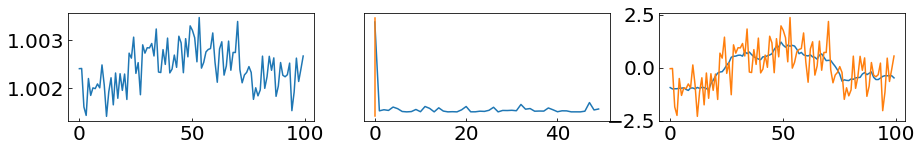

means variances acf1 cpoints entropy linearity trend curvature maxpss
1.002	0.000	0.401	37.000	0.020	0.014	0.193	-1.715	1.171


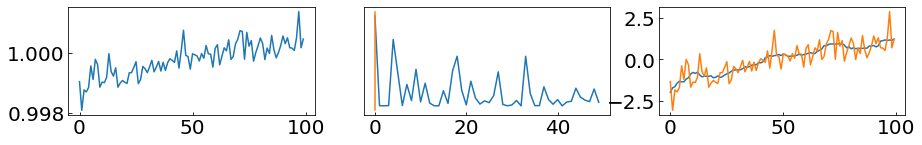

means variances acf1 cpoints entropy linearity trend curvature maxpss
1.000	0.001	0.688	23.000	0.008	0.654	1.336	-0.396	1.162


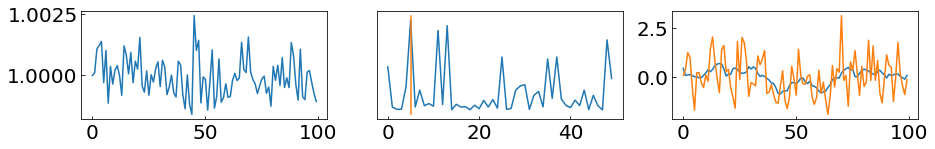

means variances acf1 cpoints entropy linearity trend curvature maxpss
1.000	0.001	0.059	49.000	0.040	0.039	-0.326	0.390	1.039


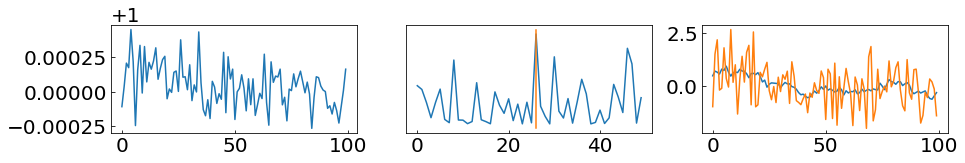

means variances acf1 cpoints entropy linearity trend curvature maxpss
1.000	0.000	0.177	41.000	0.002	0.149	-0.637	0.226	1.061


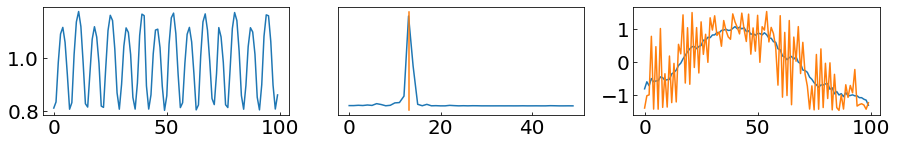

means variances acf1 cpoints entropy linearity trend curvature maxpss
0.985	0.126	0.610	28.000	140.989	0.000	0.001	-0.172	2.020


In [214]:
print("means", "variances", "acf1", "cpoints", "entropy", 
           "linearity", "trend", "curvature", "maxpss (only used if >1)")
for i in range(13):
    fig = pl.figure(figsize=(15,2))
    ax = fig.add_subplot(131)
    if i == 0:
        ax.set_title("original lcv")
    pl.plot(lcvsKepfixed[i,1])
    ax = fig.add_subplot(132)
    if i == 0:
        ax.set_title("power spectrum")
    pl.plot(ps[i])
    if maxpss[i] > 1:
        pl.plot([mainPeriod[i]-1, mainPeriod[i]-1], pl.ylim())
    ax.set_yticks([])
    ax = fig.add_subplot(133)
    if i == 0:
        ax.set_title("folder lcv")
    pl.plot(newlcsLP[i])
    pl.plot(newlcs[i,0])    
    pl.show()
    print("means", "variances", "acf1", "cpoints", "entropy", 
           "linearity", "trend", "curvature", "maxpss")
    print("%.3f\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f"%(
        means[i], variances[i], acf1[i], cpoints[i], 
        lcentropy[i]*100, linearity[i],trend[i], curvature[i], maxpss[i]))


### to measure the strength of the seasonality we measure the symmetry of the folded time series

#### interpolate folded time series with a spline of deg 4

In [215]:
x = np.arange(newlcsLP[i].shape[0])
#fitlcvs  = [numpy.polyfit(x, newlcsLP[i], 2)
#             for i in range(len(lcvsKeprefixed))]
#fitlcvs[i]

fitlcvs = [sp.interpolate.UnivariateSpline(x, 
                        newlcsLP[i], k=4)
             for i in range(len(lcvsKepfixednst))] 
#fitlcvs[i](x)

### find the location of the local min or max: that is the symmetry point. store its value (its a feature)
### measure the residuals of using one half as a model for the other 
### normalize that value by the number of points in the symmetric part of the time series and by the size of the change (max-min)

# this is the set of best frequency for the first 13 lcvs
freqs[mainPeriod[:13]]

//anaconda/envs/earth-analytics-python/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



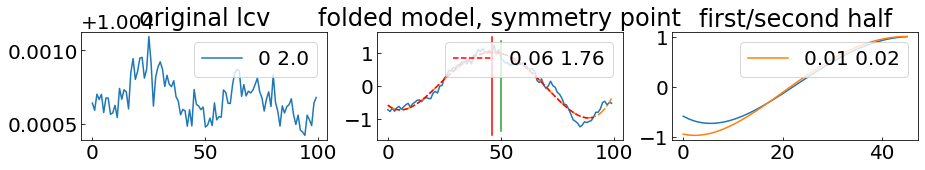

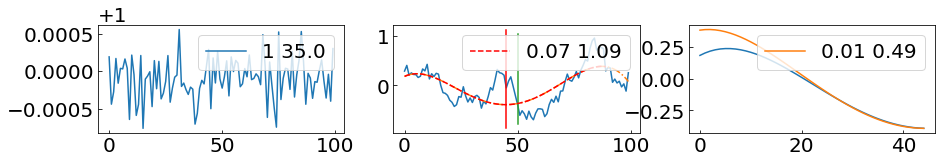

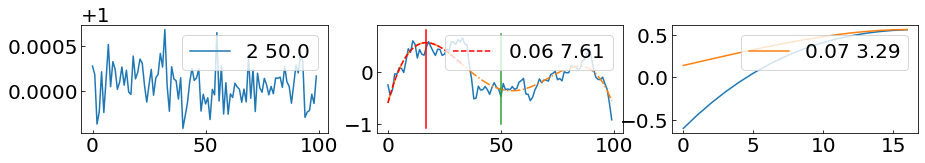

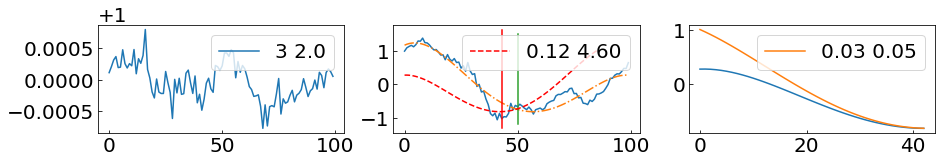

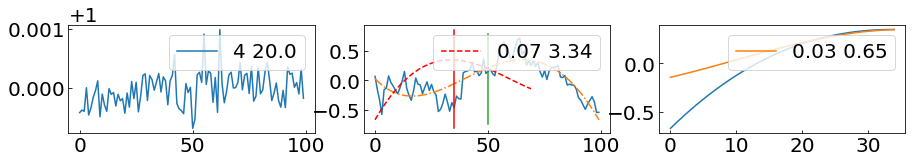

...

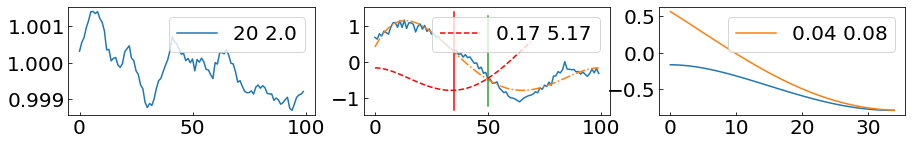

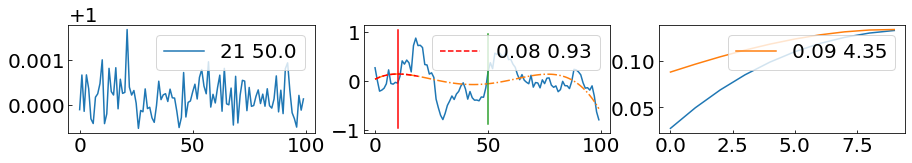

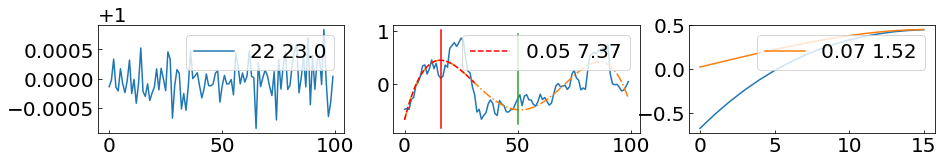

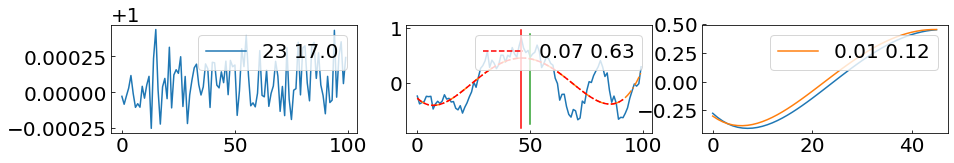

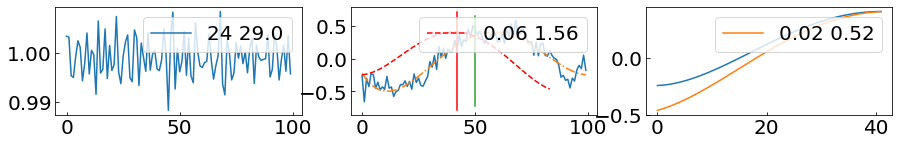

In [217]:
simloc = np.zeros(lcvsKepfixed.shape[0])
simres = np.zeros(lcvsKepfixed.shape[0])
simresOnN = np.zeros(lcvsKepfixed.shape[0])
npoints = int(lcvshape[2] / 2)
for i in range(25):
    fig = pl.figure(figsize=(15,2))
    ax = fig.add_subplot(131)
    if i==0:
        ax.set_title("original lcv")
    pl.plot(lcvsKepfixed[i,1], 
            label="%d %.1f"%(i, mainPeriod[i]))
    pl.legend(loc=1)
    ax = fig.add_subplot(132)
    if i==0:
        ax.set_title("folded model, symmetry point")
    #pl.plot(ps[i], '--')
    thisfit = fitlcvs[i](x)#fitlcvs[i][0] * x**2 +\
            #fitlcvs[i][1] * x + fitlcvs[i][2]
    pl.plot(newlcsLP[i], '-')
    pl.plot(thisfit, '-.')
    mx, mn = np.argmax(thisfit), np.argmin(thisfit)
    cloc = mx if np.abs(mx - npoints) < np.abs(mn - npoints) else mn
    t1 = np.sqrt(np.sum((newlcsLP[i][:npoints] - 
            newlcsLP[i][npoints*2-1:npoints-1:-1])**2)) / npoints 
    if cloc < 4 or cloc > 96:
        t2 = 1
    elif cloc < npoints:
        thisfit = thisfit[:cloc*2]
        #thisfit /= (thisfit.max() - thisfit.min())
        t2 = np.sqrt(np.sum((thisfit[:cloc] -
            thisfit[cloc*2:cloc-1:-1])**2)) / cloc 
    else:
        cloc = npoints*2-cloc
        thisfit = thisfit[::-1][:cloc*2] 
        #thisfit /= (thisfit.max() - thisfit.min())
        t2 = np.sqrt(np.sum((thisfit[:cloc] -
            thisfit[cloc*2:cloc-1:-1])**2)) / cloc 
    t3 = t2 / (thisfit.max() - thisfit.min())
    simloc[i] = cloc
    simres[i] = t2
    pl.plot([npoints, npoints], pl.ylim())
    pl.plot([cloc, cloc], pl.ylim(), 'r-')
    pl.plot(thisfit, 'r--', label="%.2f %.2f"%(t1, simres[i] * 100))
    #pl.plot(newlcsLP[i], '-.')
    pl.legend(loc=1)

    ax = fig.add_subplot(133)
    if i==0:
        ax.set_title("first/second half")
    pl.plot(thisfit[:cloc])
    simresOnN[i] = t3 * freqs[mainPeriod[i]] * 100
    pl.plot(thisfit[cloc*2:cloc-1:-1], 
            label="%.2f %.2f"%(t3, simresOnN[i]))
    pl.legend(loc=1)

    

# combine features

features inspired by https://robjhyndman.com/papers/cikm2015.pdf

In [218]:
# check that features have the right size
means.shape, variances.shape, acf1.shape, cpoints.shape, lcentropy.shape 

((2500,), (2500,), (2500,), (2500,), (2500,))

In [192]:
features = np.asanyarray([means, variances, acf1, cpoints, lcentropy, linearity, 
 trend, curvature, maxpss, simloc, simres, simresOnN])
flabels = ["means", "variances", "acf1", "cpoints", "entropy", 
           "linearity", "trend", "curvature", "maxpss", 
           "simloc", "simres", "simresOnN"]

features.T.shape

(2500, 12)

## whitening

In [193]:
#whitening
featuresW = sklearn.preprocessing.scale(features, axis=1)

### features distribution

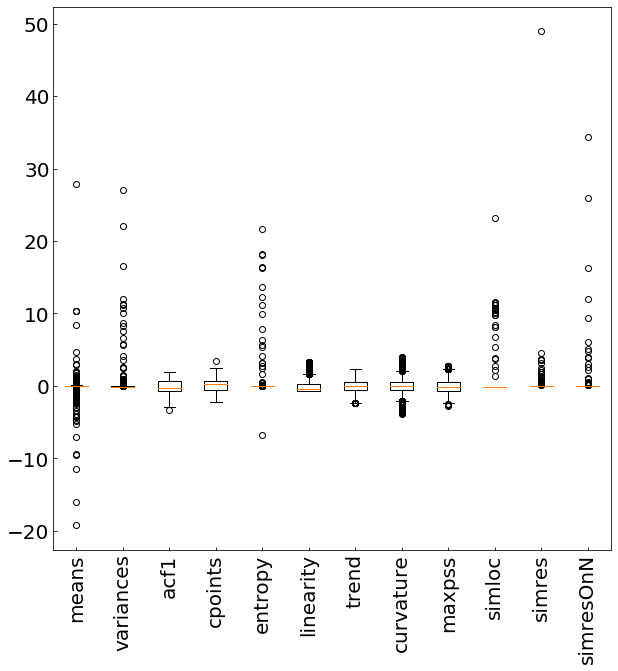

In [194]:
pl.boxplot(featuresW.T)
pl.xticks(list(range(len(flabels) + 1))[1:], flabels, rotation=90);

distribution of the 12 features that describe the space

In [195]:
pca = PCA()
pca.fit(featuresW)
coeffsF = pca.transform(featuresW) # -> the coefficients!!
evecsF = pca.components_
evalsF = pca.explained_variance_ratio_
evals_csF = evalsF.cumsum()

pcaCoeffMatrix = np.dot(evecsF, featuresW.T).T
X_proj = pca.fit_transform(featuresW)
X_inv_proj = pca.inverse_transform(X_proj)
X_proj.shape, X_inv_proj.shape, evecsF.shape, coeffsF.shape

((12, 12), (12, 2500), (100, 100), (2500, 100))

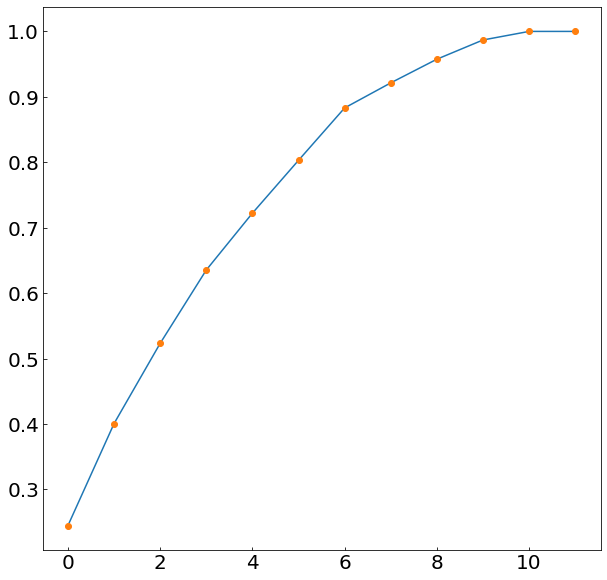

still the first 2 feature do not capture 50% of the variance. it looks like there is an elbow at 6. Hyndman15 uses 2


In [220]:
pl.plot(evals_csF)
pl.plot(evals_csF, 'o')
#pl.ylim(0.7,1.2)
pl.show()
print("still the first 2 feature do not capture 50% of the variance. it looks like there is an elbow at 6. Hyndman15 uses 2")

//anaconda/envs/earth-analytics-python/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning:

invalid value encountered in log10

//anaconda/envs/earth-analytics-python/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning:

invalid value encountered in log10



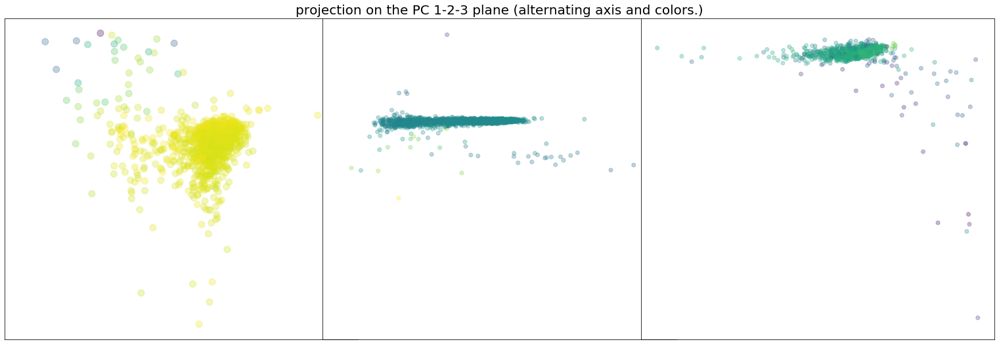

the first two components (left, colored by the third) are more independent. The color distribution is also encouraging, with the bulk of the distribution in the same color (similar PC3 values, and in a spherical distribution)The other plots show PC0vs2 colored by 1 and PC1 vs 2 colored by 0. The 2D projections are less spherical


In [224]:
fig = pl.figure(figsize=(27,9))
fig.add_subplot(131)
pl.scatter(pca.components_[0], np.log10(pca.components_[1]), c=pca.components_[2], s=100, alpha=0.3)
pl.xticks([])
pl.yticks([])
fig.add_subplot(132)
pl.title("projection on the PC 1-2-3 plane (alternating axis and colors.)", fontsize=20)
pl.scatter(pca.components_[0], pca.components_[2], c=pca.components_[1], alpha=0.3)
pl.xticks([])
pl.yticks([])
fig.add_subplot(133)
pl.scatter(np.log10(pca.components_[1]), pca.components_[2], c=pca.components_[0], alpha=0.3)
pl.xticks([])
pl.yticks([])
plt.subplots_adjust(wspace=-0.1)
pl.show()
print("the first two components (left, colored by the third) are more independent. " + 
      "The color distribution is also encouraging, with the bulk of the distribution in the same color (similar PC3 values, and in a spherical distribution)" + 
      "The other plots show PC0vs2 colored by 1 and PC1 vs 2 colored by 0. The 2D projections are less spherical")

## PC1-PC2 KDE density

//anaconda/envs/earth-analytics-python/lib/python3.6/site-packages/fastkde/fastKDE.py:465: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.

//anaconda/envs/earth-analytics-python/lib/python3.6/site-packages/fastkde/fastKDE.py:473: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



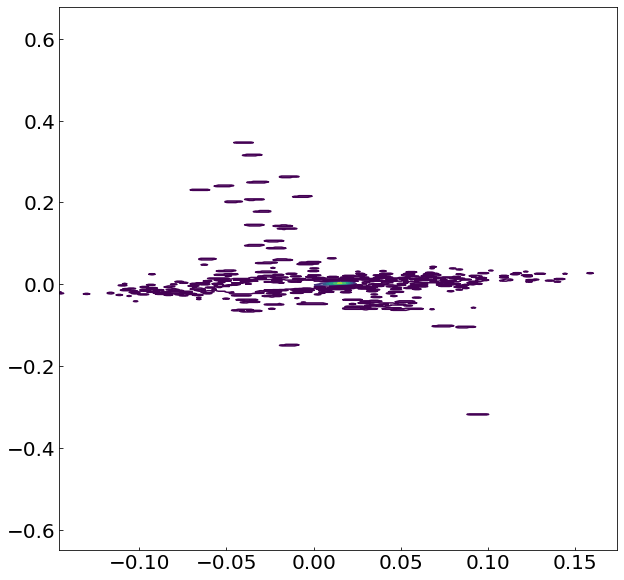

In [225]:
myPDF,axes = fastKDE.pdf(pca.components_[0], pca.components_[1])

#Extract the axes from the axis list
v1,v2 = axes

#Plot contours of the PDF should be a set of concentric ellipsoids centered on
#(0.1, -300) Comparitively, the y axis range should be tiny and the x axis range
#should be large
pl.contour(v1, v2, myPDF)
pl.show()


In [202]:
densityatpointsF = fastKDE.pdf_at_points(pca.components_[0], 
                                        pca.components_[1],
                      list_of_points = list(zip(pca.components_[0], 
                                        pca.components_[1])))

# local density vs standard deviation of the original lightcurve

//anaconda/envs/earth-analytics-python/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning:

invalid value encountered in log10



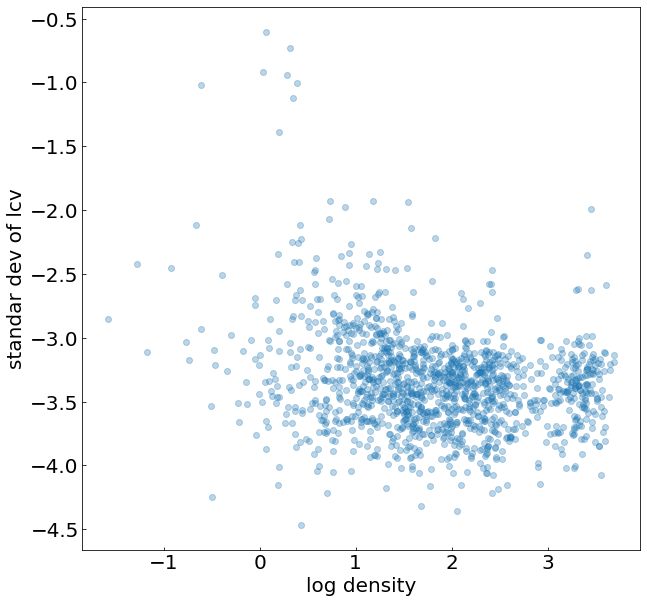

In [226]:
ax = pl.figure().add_subplot(111)
pl.xlabel("log density")
pl.ylabel("standar dev of lcv")

pl.scatter(np.log10(densityatpointsF), 
           np.log10((lcvsKep[:,1]).std(axis=1)), alpha=0.3,
          label="power spectrum")
pl.ylim();

In [207]:
iplot([go.Histogram2dContour(x=np.log10(densityatpointsF), 
           y=np.log10((lcvsKep[:,1]).std(axis=1)), 
                             contours=dict(coloring='heatmap')),
       go.Scatter(x=np.log10(densityatpointsF), 
           y=np.log10((lcvsKep[:,1]).std(axis=1)), text = ["%d"%i for i in range(2500)],
        hoverinfo = 'text',
                  mode='markers', 
                  marker=dict(color=list(range(2500)), size=3, opacity=0.3))], show_link=False)


//anaconda/envs/earth-analytics-python/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning:

invalid value encountered in log10

//anaconda/envs/earth-analytics-python/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning:

invalid value encountered in log10



the log density does not track stdev, which is good

## KDE density feature PCA ranks

In [227]:
orderdens = np.argsort(densityatpointsF)[-25:]

In [251]:
featuresW.T.shape

(2500, 12)

top 25 most isolated in feature PCA up to 10 components
		lightcirve		power spectrum


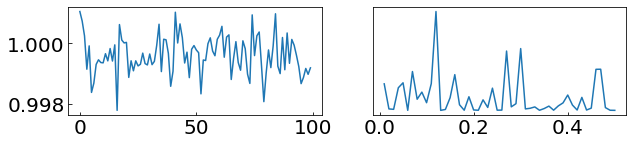

[11.08, 74.24, 39.52, 78.88, 80.24, 10.96, 42.72, 26.92, 62.64, 49.52, 49.52, 49.52]


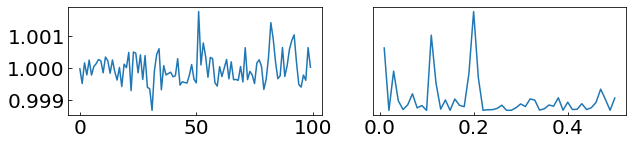

[40.8, 53.4, 52.92, 89.34, 52.4, 25.32, 61.08, 83.2, 74.64, 49.52, 49.52, 49.52]


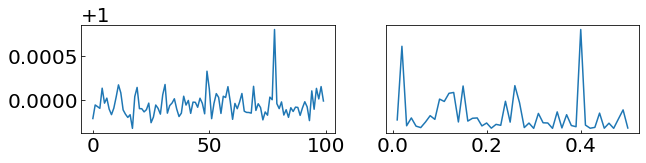

[36.36, 3.72, 40.92, 69.5, 6.0, 6.56, 51.28, 48.4, 62.24, 49.52, 49.52, 49.52]
variances 3.72
entropy 6.0
linearity 6.56


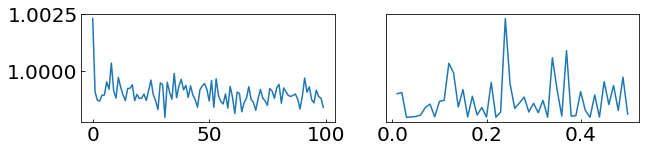

[6.16, 63.36, 17.52, 52.76, 76.48, 53.16, 21.6, 81.96, 50.16, 49.52, 49.52, 49.52]
means 6.16


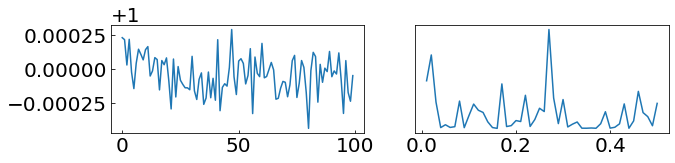

[40.4, 7.52, 29.88, 61.32, 10.2, 43.92, 26.24, 86.44, 65.44, 49.52, 49.52, 49.52]
variances 7.52


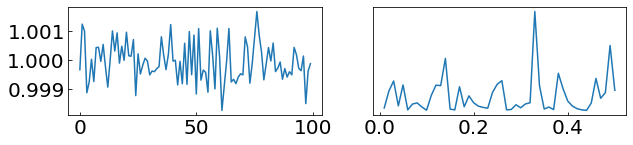

[35.56, 77.52, 14.36, 56.96, 82.52, 30.08, 33.48, 53.16, 66.72, 49.52, 49.52, 49.52]


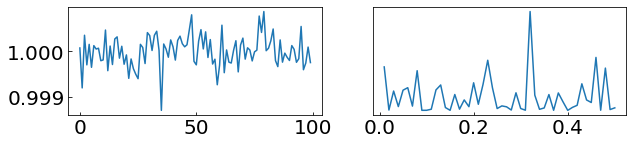

[56.72, 35.44, 24.28, 69.5, 35.88, 17.92, 57.24, 19.12, 70.68, 49.52, 49.52, 49.52]


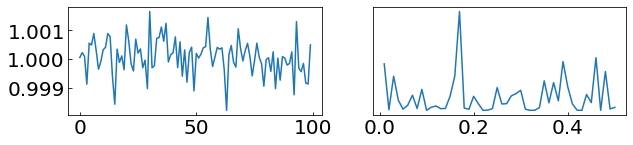

[75.08, 70.6, 11.96, 69.5, 75.56, 41.2, 27.56, 18.16, 72.8, 49.52, 49.52, 49.52]


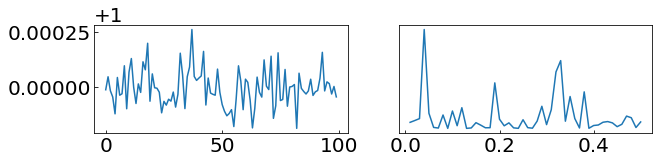

[49.48, 1.2, 39.28, 74.32, 1.44, 22.68, 37.16, 59.8, 68.6, 49.52, 49.52, 49.52]
variances 1.2
entropy 1.44


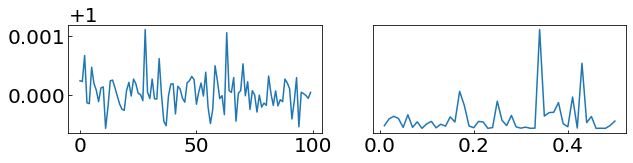

[60.52, 27.68, 18.32, 74.32, 25.8, 26.68, 35.16, 49.72, 79.96, 49.52, 49.52, 49.52]


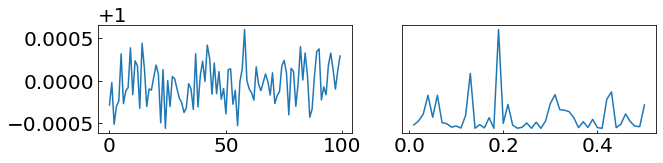

[42.8, 24.64, 20.24, 69.5, 26.12, 40.96, 68.64, 62.76, 77.12, 49.52, 49.52, 49.52]


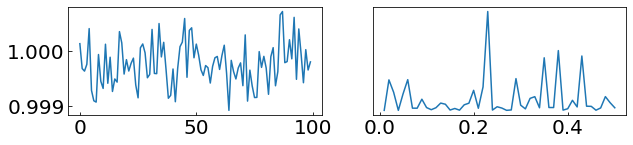

[15.88, 46.44, 39.96, 74.32, 45.84, 26.64, 61.8, 58.08, 69.28, 49.52, 49.52, 49.52]


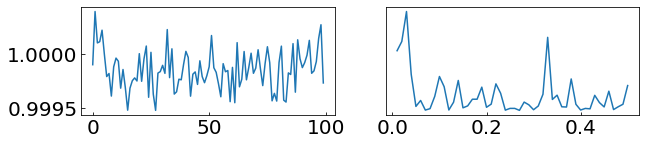

[22.84, 13.84, 45.68, 61.32, 16.64, 6.04, 51.0, 91.36, 60.56, 49.52, 49.52, 49.52]
linearity 6.04
curvature 91.36


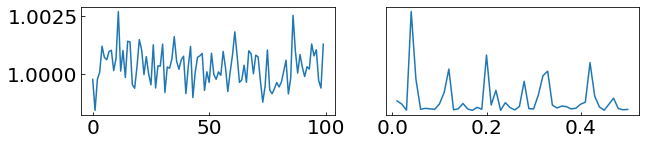

[88.64, 81.96, 38.64, 78.88, 85.36, 23.08, 37.04, 66.24, 73.16, 49.52, 49.52, 49.52]


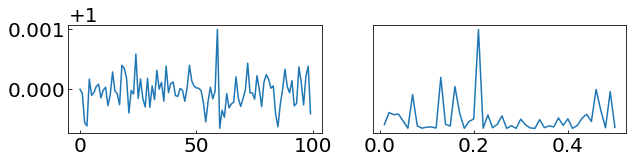

[38.04, 24.8, 43.88, 86.28, 23.24, 3.56, 46.24, 55.56, 79.44, 49.52, 49.52, 49.52]
linearity 3.56


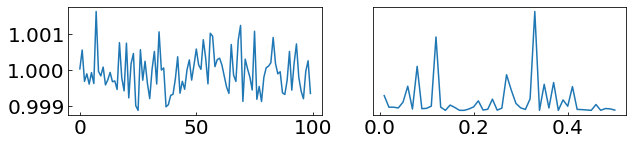

[33.92, 63.76, 22.16, 69.5, 69.52, 12.96, 54.64, 28.84, 74.2, 49.52, 49.52, 49.52]


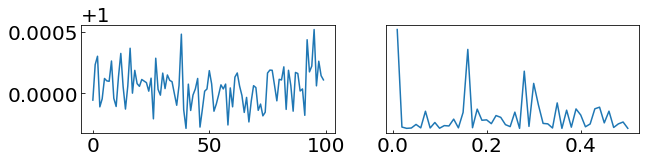

[65.8, 9.56, 34.0, 52.76, 16.24, 3.6, 49.8, 93.2, 67.48, 49.52, 49.52, 49.52]
variances 9.56
linearity 3.6
curvature 93.2


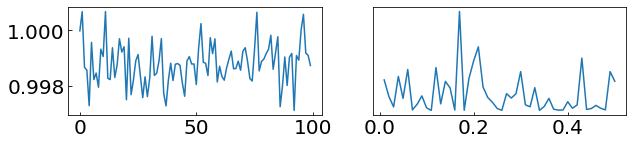

[5.24, 81.28, 35.24, 52.76, 86.24, 22.32, 59.64, 82.04, 53.88, 49.52, 49.52, 49.52]
means 5.24


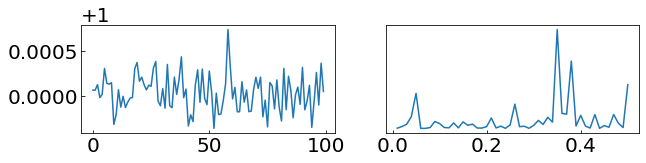

[62.8, 16.72, 32.28, 82.94, 12.68, 24.0, 36.52, 55.48, 80.28, 49.52, 49.52, 49.52]


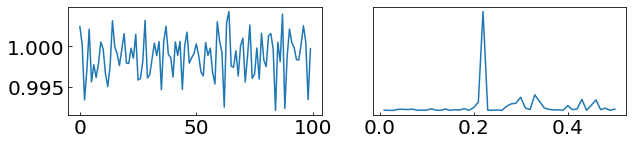

[5.4, 96.2, 1.96, 89.34, 97.88, 13.44, 54.96, 48.44, 95.92, 49.52, 49.52, 49.52]
means 5.4
variances 96.2
acf1 1.96
entropy 97.88
maxpss 95.92


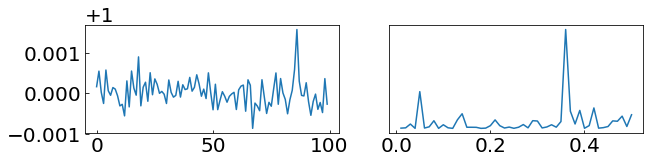

[51.72, 33.16, 9.64, 91.68, 36.16, 50.2, 23.0, 45.96, 92.12, 49.52, 49.52, 49.52]
acf1 9.64
cpoints 91.68
maxpss 92.12


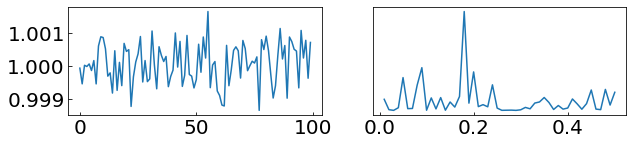

[70.56, 72.92, 16.72, 69.5, 77.32, 26.56, 61.72, 72.88, 84.44, 49.52, 49.52, 49.52]


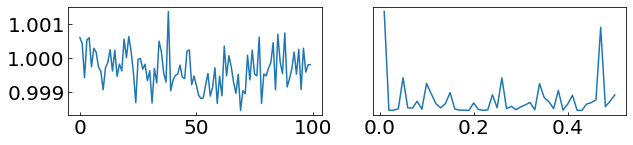

[12.44, 67.76, 24.32, 74.32, 80.8, 36.76, 29.84, 93.4, 83.92, 49.52, 49.52, 49.52]
curvature 93.4


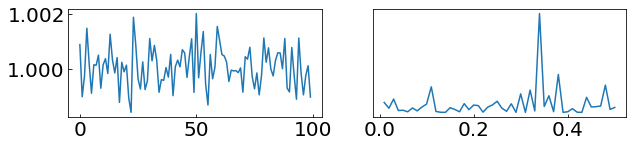

[69.6, 80.12, 6.8, 78.88, 84.52, 7.0, 44.68, 29.76, 89.64, 49.52, 49.52, 49.52]
acf1 6.8
linearity 7.0


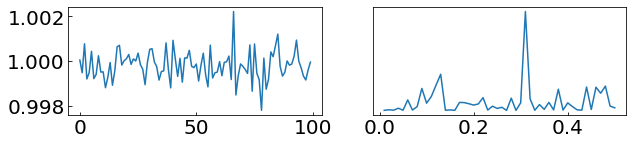

[18.84, 74.96, 4.28, 65.18, 79.16, 2.64, 46.64, 51.24, 88.52, 49.52, 49.52, 49.52]
acf1 4.28
linearity 2.64


In [263]:
print ("top 25 most isolated in feature PCA up to 10 components")
print("\t\tlightcirve\t\tpower spectrum")
for i in np.argsort(densityatpointsF)[-25:]:
    fig = pl.figure(figsize=(10,2))
    ax = fig.add_subplot(121)
    pl.plot(lcvsKep[i,1] )
    ax = fig.add_subplot(122)
    pl.plot(freqs[1:], ps[i])
    pl.yticks([])
    pl.show()
    tmp = [scipy.stats.percentileofscore(featuresW[j], featuresW[j,i]) for j in range(featuresW.shape[0])]
    print(tmp)
    for j,t in enumerate(tmp):
        if t > 90 or t<10:
            print(flabels[j],t)

In [255]:
print ("TOP 25 KDE lcv density in top 25 KDE features density")
for d in np.argsort(densityatpoints)[-25:]:
    if d in np.argsort(densityatpointsF)[-25:]:
        print (d)
print()        
print ("TOP 50")
for d in np.argsort(densityatpoints)[-50:]:
    if d in np.argsort(densityatpointsF)[-50:]:
        print (d)

TOP 25 KDE lcv density in top 25 KDE features density

TOP 50
1996
1158
1465
1460


the PCA+KDE scores are NOT correlated to the original variance

# try isolation on the features

In [256]:
clf = IsolationForest(max_samples=100, contamination=0.1, random_state=100)
clf.fit(featuresW.T) #, sample_weight=1.0/(Xfixed[:,2,:])**2)
scores_pred_features = clf.decision_function(featuresW.T)
#scores_pred_Norm = clf.score_samples(lcvsKepNormed[:,1,:])
#.sample_score(lcvsKepNormed[:,1,:])

threshold_Norm  = stats.scoreatpercentile(scores_pred_features, 100 * 0.1)
y_predNorm = clf.predict(featuresW.T)


//anaconda/envs/earth-analytics-python/lib/python3.6/site-packages/sklearn/ensemble/iforest.py:223: FutureWarning:

behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.

//anaconda/envs/earth-analytics-python/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.

//anaconda/envs/earth-analytics-python/lib/python3.6/site-packages/sklearn/ensemble/iforest.py:417: DeprecationWarning:

threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.



In [257]:
iplot([go.Histogram2dContour(x=scores_pred_features, 
           y=np.log10((lcvsKep[:,1]).std(axis=1)), 
                             contours=dict(coloring='heatmap')),
       go.Scatter(x=scores_pred_features, 
           y=np.log10((lcvsKep[:,1]).std(axis=1)), text = ["%d"%i for i in range(2500)],
        hoverinfo = 'text',
                  mode='markers', 
                  marker=dict(color=list(range(2500)), size=3, opacity=0.3))], show_link=False)


the isolation forest scores are correlated to the original variance

//anaconda/envs/earth-analytics-python/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning:

invalid value encountered in log10



Text(0, 0.5, 'isolation forest feature PCA density')

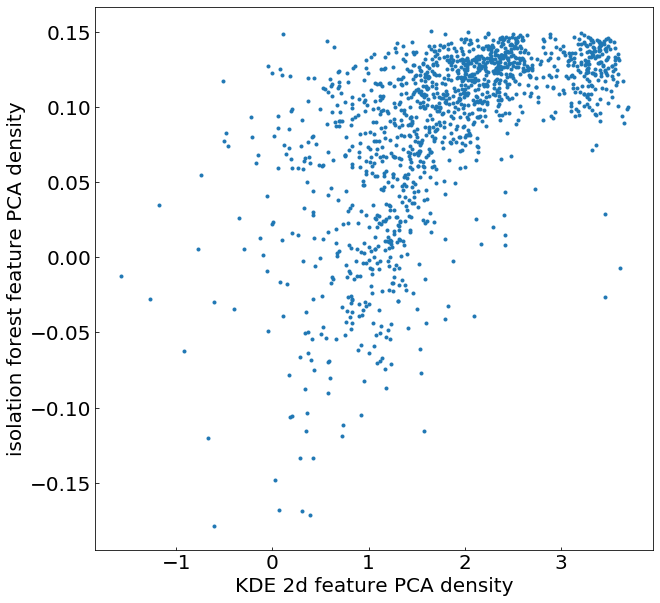

In [259]:
pl.figure(figsize=(10,10))
pl.plot(np.log10(densityatpointsF), scores_pred_features, '.')
pl.xlabel("KDE 2d feature PCA density")
pl.ylabel("isolation forest feature PCA density")

In [260]:
orderIsoPCAf = np.argsort(scores_pred_features)[-25:]

top 25 fasters IF split in feature PCA up to 10 components
		lightcirve		power spectrum


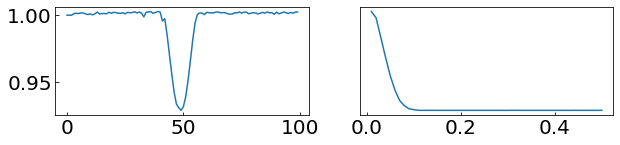

[2.36, 99.2, 97.0, 2.92, 99.28, 3.96, 49.96, 94.72, 75.48, 49.52, 49.52, 49.52]
means 2.36 -0.10891776192063796
variances 99.2 -0.10891776192063796
acf1 97.0 -0.10891776192063796
cpoints 2.92 -0.10891776192063796
entropy 99.28 -0.10891776192063796
linearity 3.96 -0.10891776192063796
curvature 94.72 -0.10891776192063796


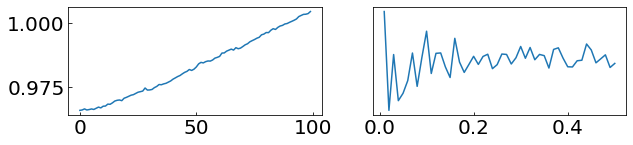

[1.0, 99.08, 97.56, 1.18, 97.84, 99.88, 99.88, 63.92, 3.24, 49.52, 49.52, 49.52]
means 1.0 -0.11152984625575957
variances 99.08 -0.11152984625575957
acf1 97.56 -0.11152984625575957
cpoints 1.18 -0.11152984625575957
entropy 97.84 -0.11152984625575957
linearity 99.88 -0.11152984625575957
trend 99.88 -0.11152984625575957
maxpss 3.24 -0.11152984625575957


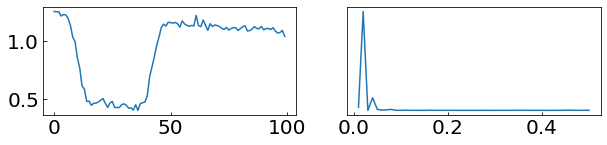

[0.16, 100.0, 99.16, 2.92, 0.04, 75.36, 86.96, 85.64, 98.84, 49.52, 49.52, 49.52]
means 0.16 -0.1149503156028382
variances 100.0 -0.1149503156028382
acf1 99.16 -0.1149503156028382
cpoints 2.92 -0.1149503156028382
entropy 0.04 -0.1149503156028382
maxpss 98.84 -0.1149503156028382


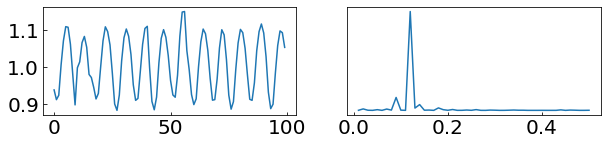

[99.32, 99.56, 80.8, 21.32, 99.52, 10.04, 53.24, 56.0, 98.44, 49.52, 49.52, 49.52]
means 99.32 -0.11528629750629737
variances 99.56 -0.11528629750629737
entropy 99.52 -0.11528629750629737
maxpss 98.44 -0.11528629750629737


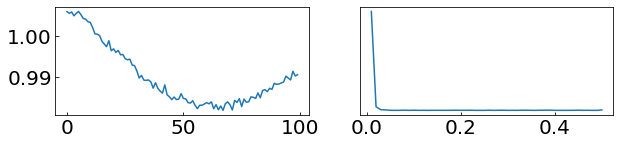

[1.48, 98.56, 96.08, 7.18, 98.92, 89.2, 5.24, 98.64, 96.04, 49.52, 49.52, 49.52]
means 1.48 -0.1155405701196841
variances 98.56 -0.1155405701196841
acf1 96.08 -0.1155405701196841
cpoints 7.18 -0.1155405701196841
entropy 98.92 -0.1155405701196841
trend 5.24 -0.1155405701196841
curvature 98.64 -0.1155405701196841
maxpss 96.04 -0.1155405701196841


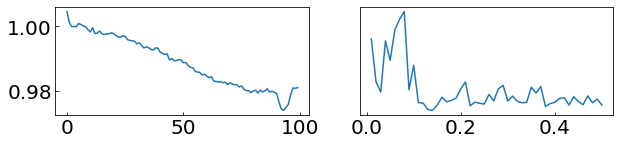

[1.32, 98.72, 96.8, 4.18, 97.56, 98.96, 0.44, 60.56, 34.24, 49.52, 49.52, 49.52]
means 1.32 -0.1160605502733798
variances 98.72 -0.1160605502733798
acf1 96.8 -0.1160605502733798
cpoints 4.18 -0.1160605502733798
entropy 97.56 -0.1160605502733798
linearity 98.96 -0.1160605502733798
trend 0.44 -0.1160605502733798


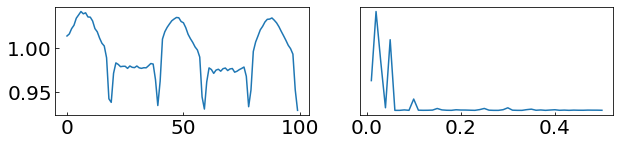

[2.48, 99.32, 87.2, 6.3, 99.4, 32.4, 32.28, 92.44, 83.96, 49.52, 49.52, 49.52]
means 2.48 -0.11700108616031724
variances 99.32 -0.11700108616031724
cpoints 6.3 -0.11700108616031724
entropy 99.4 -0.11700108616031724
curvature 92.44 -0.11700108616031724


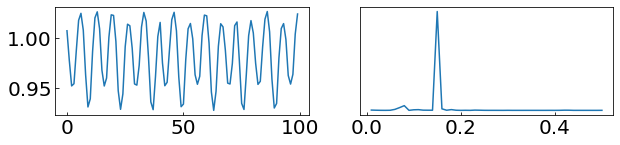

[0.92, 99.36, 75.56, 27.26, 99.32, 3.4, 46.32, 61.52, 99.36, 49.52, 49.52, 49.52]
means 0.92 -0.11877341166258326
variances 99.36 -0.11877341166258326
entropy 99.32 -0.11877341166258326
linearity 3.4 -0.11877341166258326
maxpss 99.36 -0.11877341166258326


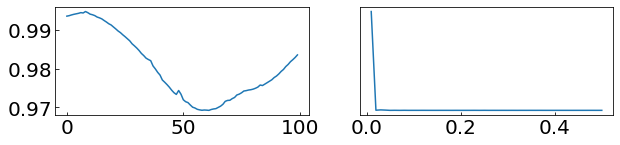

[0.76, 98.76, 99.4, 2.92, 99.0, 88.28, 5.6, 98.32, 89.56, 49.52, 49.52, 49.52]
means 0.76 -0.11880802237921306
variances 98.76 -0.11880802237921306
acf1 99.4 -0.11880802237921306
cpoints 2.92 -0.11880802237921306
entropy 99.0 -0.11880802237921306
trend 5.6 -0.11880802237921306
curvature 98.32 -0.11880802237921306


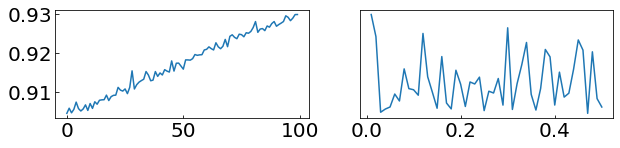

[0.2, 98.64, 94.8, 6.3, 96.68, 99.56, 99.68, 46.28, 2.76, 49.52, 49.52, 49.52]
means 0.2 -0.12045434685753442
variances 98.64 -0.12045434685753442
acf1 94.8 -0.12045434685753442
cpoints 6.3 -0.12045434685753442
entropy 96.68 -0.12045434685753442
linearity 99.56 -0.12045434685753442
trend 99.68 -0.12045434685753442
maxpss 2.76 -0.12045434685753442


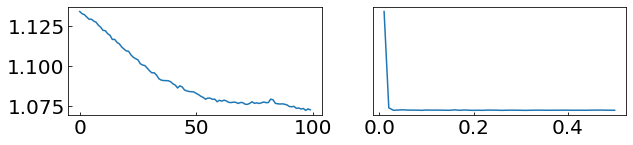

[99.96, 99.24, 96.2, 1.18, 99.12, 96.08, 1.72, 94.6, 90.24, 49.52, 49.52, 49.52]
means 99.96 -0.12516275482228223
variances 99.24 -0.12516275482228223
acf1 96.2 -0.12516275482228223
cpoints 1.18 -0.12516275482228223
entropy 99.12 -0.12516275482228223
linearity 96.08 -0.12516275482228223
trend 1.72 -0.12516275482228223
curvature 94.6 -0.12516275482228223
maxpss 90.24 -0.12516275482228223


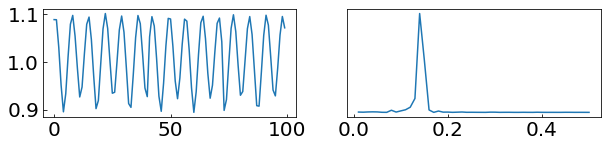

[99.44, 99.52, 76.4, 25.2, 99.68, 2.48, 49.16, 63.16, 92.8, 49.52, 49.52, 49.52]
means 99.44 -0.12544003430759298
variances 99.52 -0.12544003430759298
entropy 99.68 -0.12544003430759298
linearity 2.48 -0.12544003430759298
maxpss 92.8 -0.12544003430759298


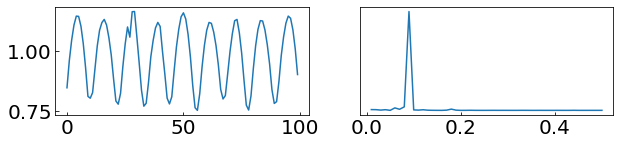

[0.72, 99.84, 85.32, 17.28, 99.44, 2.84, 46.6, 72.28, 99.56, 49.52, 49.52, 49.52]
means 0.72 -0.13214141822076908
variances 99.84 -0.13214141822076908
entropy 99.44 -0.13214141822076908
linearity 2.84 -0.13214141822076908
maxpss 99.56 -0.13214141822076908


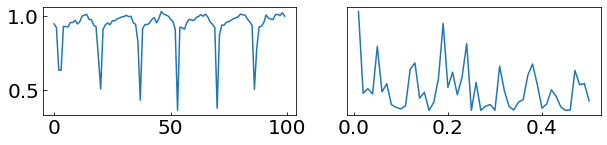

[0.28, 99.48, 72.44, 21.32, 99.64, 56.4, 76.6, 18.12, 27.48, 49.52, 49.52, 49.52]
means 0.28 -0.13334984442460418
variances 99.48 -0.13334984442460418
entropy 99.64 -0.13334984442460418


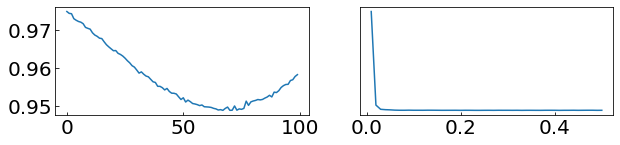

[0.32, 98.68, 97.16, 2.92, 98.88, 91.24, 4.2, 98.2, 96.28, 49.52, 49.52, 49.52]
means 0.32 -0.13346080671113314
variances 98.68 -0.13346080671113314
acf1 97.16 -0.13346080671113314
cpoints 2.92 -0.13346080671113314
entropy 98.88 -0.13346080671113314
linearity 91.24 -0.13346080671113314
trend 4.2 -0.13346080671113314
curvature 98.2 -0.13346080671113314
maxpss 96.28 -0.13346080671113314


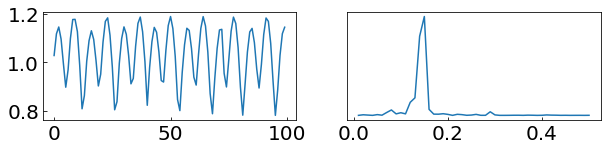

[99.76, 99.72, 76.24, 26.14, 100.0, 10.48, 42.96, 56.96, 85.52, 49.52, 49.52, 49.52]
means 99.76 -0.133480264557572
variances 99.72 -0.133480264557572
entropy 100.0 -0.133480264557572


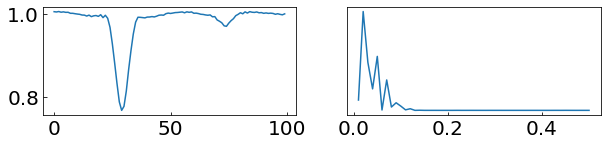

[0.96, 99.44, 94.84, 5.28, 99.56, 44.72, 70.56, 85.6, 85.76, 49.52, 49.52, 49.52]
means 0.96 -0.13952020242387875
variances 99.44 -0.13952020242387875
acf1 94.84 -0.13952020242387875
cpoints 5.28 -0.13952020242387875
entropy 99.56 -0.13952020242387875


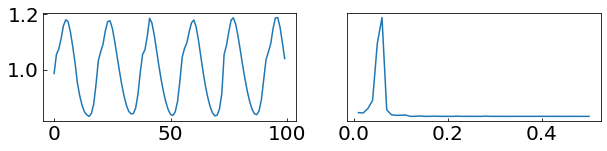

[99.24, 99.76, 91.76, 11.74, 99.92, 3.84, 49.92, 83.8, 88.12, 49.52, 49.52, 49.52]
means 99.24 -0.14848204710125923
variances 99.76 -0.14848204710125923
acf1 91.76 -0.14848204710125923
entropy 99.92 -0.14848204710125923
linearity 3.84 -0.14848204710125923


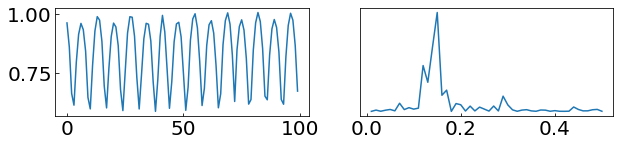

[0.04, 99.88, 74.88, 26.14, 99.88, 13.24, 54.76, 52.4, 83.04, 49.52, 49.52, 49.52]
means 0.04 -0.16166845446588007
variances 99.88 -0.16166845446588007
entropy 99.88 -0.16166845446588007


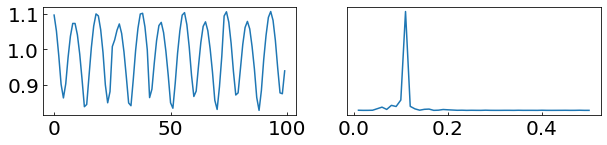

[0.88, 99.6, 82.24, 20.04, 99.72, 7.56, 44.44, 46.84, 98.56, 49.52, 49.52, 49.52]
means 0.88 -0.1653128131379804
variances 99.6 -0.1653128131379804
entropy 99.72 -0.1653128131379804
linearity 7.56 -0.1653128131379804
maxpss 98.56 -0.1653128131379804


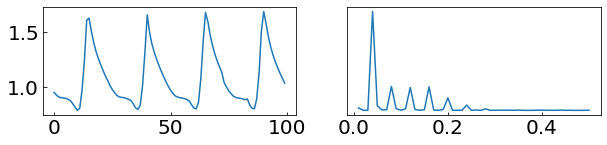

[99.84, 99.96, 89.36, 9.6, 99.96, 33.8, 65.24, 56.12, 94.2, 49.52, 49.52, 49.52]
means 99.84 -0.16806279926744772
variances 99.96 -0.16806279926744772
cpoints 9.6 -0.16806279926744772
entropy 99.96 -0.16806279926744772
maxpss 94.2 -0.16806279926744772


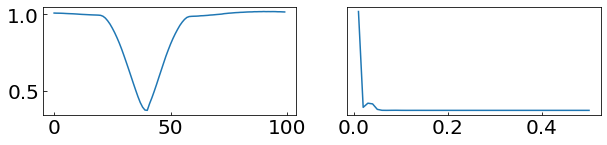

[0.12, 99.92, 99.88, 2.92, 99.48, 47.36, 71.76, 97.72, 79.48, 49.52, 49.52, 49.52]
means 0.12 -0.16901535600271467
variances 99.92 -0.16901535600271467
acf1 99.88 -0.16901535600271467
cpoints 2.92 -0.16901535600271467
entropy 99.48 -0.16901535600271467
curvature 97.72 -0.16901535600271467


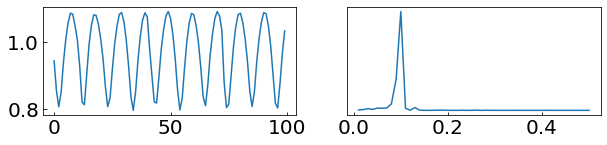

[0.48, 99.68, 83.72, 18.24, 99.76, 0.92, 48.32, 37.12, 96.12, 49.52, 49.52, 49.52]
means 0.48 -0.17148852018459992
variances 99.68 -0.17148852018459992
entropy 99.76 -0.17148852018459992
linearity 0.92 -0.17148852018459992
maxpss 96.12 -0.17148852018459992


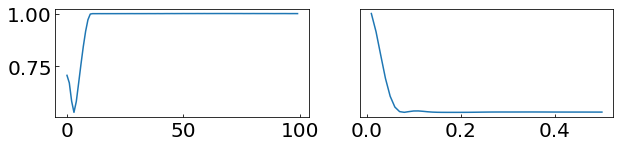

[0.6, 99.64, 92.04, 1.18, 99.8, 73.2, 85.6, 2.6, 84.96, 49.52, 49.52, 49.52]
means 0.6 -0.17850504560231184
variances 99.64 -0.17850504560231184
acf1 92.04 -0.17850504560231184
cpoints 1.18 -0.17850504560231184
entropy 99.8 -0.17850504560231184
curvature 2.6 -0.17850504560231184


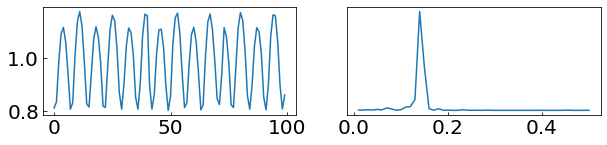

[1.08, 99.8, 76.32, 25.2, 99.84, 0.16, 47.88, 39.84, 93.88, 99.46, 99.08, 99.16]
means 1.08 -0.18560756860632677
variances 99.8 -0.18560756860632677
entropy 99.84 -0.18560756860632677
linearity 0.16 -0.18560756860632677
maxpss 93.88 -0.18560756860632677
simloc 99.46 -0.18560756860632677
simres 99.08 -0.18560756860632677
simresOnN 99.16 -0.18560756860632677


In [265]:
print ("top 25 fasters IF split in feature PCA up to 10 components")
print("\t\tlightcirve\t\tpower spectrum")
for i in np.argsort(scores_pred_features)[::-1][-25:]:
    fig = pl.figure(figsize=(10,2))
    ax = fig.add_subplot(121)
    pl.plot(lcvsKep[i,1] )
    ax = fig.add_subplot(122)
    pl.plot(freqs[1:], ps[i])
    pl.yticks([])
    pl.show()
    tmp = [scipy.stats.percentileofscore(featuresW[j], featuresW[j,i]) for j in range(featuresW.shape[0])]
    print(tmp)
    for j,t in enumerate(tmp):
        if t > 90 or t<10:
            print(flabels[j], t, scores_pred_features[i])

# completely opposite result ????!!??